# Environment Setup

## PIP

In [1]:
!pip install colour
!pip install matplotlib
!pip install pandas
!pip install utm
!pip install windrose



[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: pip install --upgrade pip


## Imports

In [2]:

import math
import matplotlib.pyplot as plt
import matplotlib_inline
import numpy as np
import pandas as pd
import utm
from itertools import product
from collections import defaultdict
import io
import pandas as pd
import pickle
import matplotlib.patches as patches
import glob
import os
import datetime
import windrose



## Functions

In [3]:
def windAnalysis(heading,windDirection, windSpeed):
    newWindDirections = []
    newWindSpeeds = []
    for i in range(0,windDirection.__len__()):
        if(windDirection[i] == 'nan' or heading[i] == 'NaN'):
            a = 1 
        elif(float(windDirection[i]) < 0):
            windScaled = 360+float(windDirection[i])
            windMagnetic = windScaled + float(heading[i])
            if(windMagnetic >= 360):
                windMagnetic = windMagnetic - 360
            newWindDirections.append(float(windMagnetic))
        elif(float(windDirection[i]) > 0):
            windMagnetic = float(windDirection[i]) +float(heading[i])
            if(windMagnetic >= 360):
                windMagnetic = windMagnetic - 360
            newWindDirections.append(float(windMagnetic))

    for i in range(0,windSpeed.__len__()):
        if(windSpeed[i] == 'nan'):
            a = 1 
        elif(float(windSpeed[i]) < 0):
            newWindSpeeds.append(float(windSpeed[i]))
        elif(float(windSpeed[i]) > 0):
            newWindSpeeds.append(float(windSpeed[i]))
        

    ## Calculate Average Wind Direction and Speed and put in a bin
    totalDirection = 0
    totalSpeed = 0
    for i in range(0,newWindDirections.__len__()):
        totalDirection += newWindDirections[i]

    for i in range(0,newWindSpeeds.__len__()):
        totalSpeed += float(newWindSpeeds[i])


    avgDirection = totalDirection/newWindDirections.__len__() 
    avgSpeed = totalSpeed/newWindSpeeds.__len__()
    if math.isnan(avgDirection):
        avgDirection = 0
    return [avgDirection,avgSpeed]

def windBins(dfArray):
    directionBins = [[] for _ in range(361)]
    speedBins = [[] for _ in range(50)]
    for i in range(0,90):
        currdf = dfArray[i]
        if (' WndDr' in currdf) and (' WndSpd' in currdf) and (' HDG' in currdf):
            averages = windAnalysis(currdf[' HDG'],currdf[' WndDr'],currdf[' WndSpd'])
            destinationBin = int(math.floor(averages[0]))
            speedBin = int(math.floor(averages[1]))
            # print(math.floor(averages[0]))
            # print(destinationBin, "--" , i,"speed",speedBin )
            directionBins[destinationBin].append(i)
            speedBins[speedBin].append(i)
    return (directionBins,speedBins)




def summaryStatistics(descent,summaryTarget:str,file,currFlight,descentNum):
    meanDescentRate = np.mean(pd.to_numeric(descent[summaryTarget]))
    medianDescentRate = np.median(pd.to_numeric(descent[summaryTarget]))
    stdDescentRate = np.std(pd.to_numeric(descent[summaryTarget]))
    maxDescentRate = np.max(pd.to_numeric(descent[summaryTarget]))
    minDescentRate = np.min(pd.to_numeric(descent[summaryTarget]))
    results = (float(meanDescentRate), float(medianDescentRate), float(stdDescentRate), float(maxDescentRate), float(minDescentRate))
    file.write("{}, {}, {},{},{},{},{}\n".format(currFlight,descentNum,results[0],results[1],results[2],results[3],results[4]))
    file.flush()


## Global Variables

In [4]:
directionBins = [[] for _ in range(361)]
speedBins = [[] for _ in range(50)]
colors =["red","green","blue","purple","orange","black","yellow","cyan","magenta","brown","pink","gray","olive","lime","teal","navy"]


# Data Ingestion

In [5]:
aircraft = "Cessna_172S_flight_"
dfArray = []
for x in range(1,101):
    new_df = pd.read_csv(f'../../Project_Data/Empirical_Data/GATS_Dataset/{aircraft}{x}.csv')
    dfArray.append(new_df)

# df = pd.read_csv(f'../../Project_Data/Empirical_Data/GATS_Dataset/{aircraft}1.csv')
# df2 = pd.read_csv(f'../../Project_Data/Empirical_Data/GATS_Dataset/{aircraft}2574.csv')
dfArray[0].head()
dfArray.__len__()

100

# Populate Descents

In [59]:
descentArray = [[] for _ in range(0,dfArray.__len__())]
headingAtLanding = []
fieldElevation = []
magneticVariation = []
crossWindComponent = []
minStep = 50
maxStep = 500
excludedDescents = []

files = glob.glob('../Figures/Empirical/Summary_Statistics/*')
for f in files:
    os.remove(f)

timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
filePitch = open("../Figures/Empirical/Summary_Statistics/pitch_summary_{}.csv".format(timestamp),"w")
fileRoll = open("../Figures/Empirical/Summary_Statistics/roll_summary_{}.csv".format(timestamp),"w")
fileCAS = open("../Figures/Empirical/Summary_Statistics/cas_summary_{}.csv".format(timestamp),"w")
fileIAS = open("../Figures/Empirical/Summary_Statistics/ias_summary_{}.csv".format(timestamp),"w")
fileVspd = open("../Figures/Empirical/Summary_Statistics/vspd_summary_{}.csv".format(timestamp),"w")
for file in [filePitch,fileRoll,fileVspd,fileCAS,fileIAS]:
    file.close()

filePitch = open("../Figures/Empirical/Summary_Statistics/pitch_summary_{}.csv".format(timestamp),"a")
fileRoll = open("../Figures/Empirical/Summary_Statistics/roll_summary_{}.csv".format(timestamp),"a")
fileCAS = open("../Figures/Empirical/Summary_Statistics/cas_summary_{}.csv".format(timestamp),"a")
fileIAS = open("../Figures/Empirical/Summary_Statistics/ias_summary_{}.csv".format(timestamp),"a")
fileVspd = open("../Figures/Empirical/Summary_Statistics/vspd_summary_{}.csv".format(timestamp),"a")

for file in [filePitch,fileRoll,fileVspd,fileCAS,fileIAS]:
    file.write("Flight#, Descent#, Mean, Median, StdDev, Max, Min\n")
file.flush()

def checkExcluded(x1,x2,excludedDescents):
    for descent in excludedDescents:
        if(x1>= descent[0] and x1 <= descent[1] 
           or
           x2>= descent[0] and x2 <= descent[1]
           or descent[0]>= x1 and descent[0] <= x2 and descent[1]>= x1 and descent[1] <= x2):
            return True
    return False

for x in range (0,90):
    currdf = dfArray[x]
    excludedDescents = []
    # x1 = 0
    # x2 = 50


    for stepCount in range(minStep,maxStep):
        step = stepCount
        altitudeDeltaThreshold = 800

        for xInner in range(0, currdf.__len__()-step, step):
            storageCount = 0
            x1 = xInner
            x2 = xInner+step
            delta = currdf['AltAGL'][x1] - currdf['AltAGL'][x2]
            if delta >= altitudeDeltaThreshold and currdf['AltAGL'][x2] <= 0 and currdf['AltAGL'][x1] > 0.0:
                # print(f"Found Descent in flight {x}: From {currdf['AltAGL'][x1]} ft AGL to {currdf['AltAGL'][x2]} ft AGL over {x2-x1} data points.")
                if(currdf['AltAGL'][x1] <= 1020 and currdf['AltAGL'][x1] >=1000):
                    # print(f"Found Descent in flight {x}: From {currdf['AltAGL'][x1]} ft AGL to {currdf['AltAGL'][x2]} ft AGL over {x2-x1} data points.")
                    excludeDescent = checkExcluded(x1,x2,excludedDescents)
                    if(excludeDescent):                
                        ## Do Nothing 
                        print("descent excluded: {} to {} in flight {}".format(x1,x2,x))
                    elif(not excludeDescent):
                        newDataFrame = pd.DataFrame(currdf[:][x1:x2]).reset_index()
                        descentArray[x].append(newDataFrame)
                        headingAtLanding.append(currdf[' HDG'][x2]) #Heading at Landing
                        fieldElevation.append(currdf[' AltMSL'][x2]) #Field Elevation at Landing
                        magneticVariation.append(currdf[' MagVar'][x2])
                        excludedDescents.append([x1,x2])
                        currFlight = x 

                        # summaryStatistics(newDataFrame,' Pitch',filePitch,currFlight,excludedDescents.__len__())
                        # summaryStatistics(newDataFrame,' Roll',fileRoll,currFlight,excludedDescents.__len__())
                        # summaryStatistics(newDataFrame,' CAS',fileCAS,currFlight,excludedDescents.__len__())
                        # summaryStatistics(newDataFrame,' IAS',fileIAS,currFlight,excludedDescents.__len__())
                        # summaryStatistics(newDataFrame,' VSpd',fileVspd,currFlight,excludedDescents.__len__())
                        print("Descent added to exclusion between: {} to {} in flight {}".format(x1,x2,x))
                        
                    ##Clearning Descent from array

                    # for i in range(x1,x2+1):
                    #     currdf['AltAGL'][i] = 0

                    # crossWindComponent.append(currdf[' WndSpd'][x2] * math.sin(currdf[' HDG'][x2]-currdf[' WndDr'][x2])) #Crosswind Component at Landing
                    storageCount+=1


        
        # descentArray[0].head()
        # x1 = xInner
        # x2 = xInner+step

descentArray.__len__()

Descent added to exclusion between: 3738 to 4005 in flight 0
Descent added to exclusion between: 2037 to 2328 in flight 0
Descent added to exclusion between: 3640 to 4004 in flight 1
Descent added to exclusion between: 4032 to 4368 in flight 2
Descent added to exclusion between: 4296 to 4654 in flight 4
Descent added to exclusion between: 2484 to 2760 in flight 6
descent excluded: 2485 to 2840 in flight 6
descent excluded: 2484 to 2898 in flight 6
Descent added to exclusion between: 5292 to 5544 in flight 7
descent excluded: 5292 to 5586 in flight 7
descent excluded: 5296 to 5627 in flight 7
descent excluded: 5295 to 5648 in flight 7
descent excluded: 5292 to 5670 in flight 7
Descent added to exclusion between: 4708 to 4922 in flight 8
Descent added to exclusion between: 4371 to 4512 in flight 9
descent excluded: 4370 to 4560 in flight 9
Descent added to exclusion between: 4176 to 4524 in flight 11
Descent added to exclusion between: 4556 to 4824 in flight 12
Descent added to exclusion

100

# Wind Direction Batch

In [43]:
bins = windBins(dfArray)
directionBins = bins[0]
speedBins = bins[1]

TypeError: summaryStatistics() missing 1 required positional argument: 'descentNum'

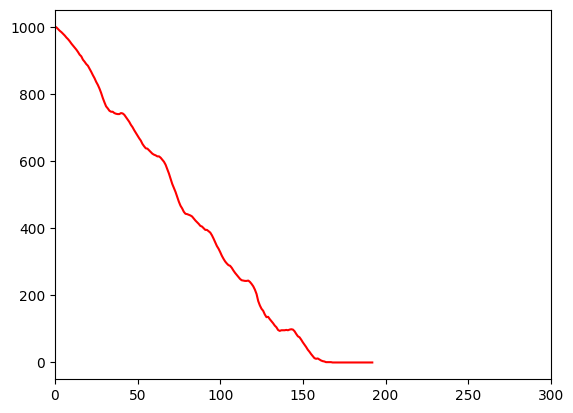

In [ ]:
files = glob.glob('../Figures/Empirical/Wind_Direction_Batch/*')
for f in files:
    os.remove(f)
timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

files = glob.glob('../Figures/Empirical/Summary_Statistics/summary_wind_direction_*')
for f in files:
    os.remove(f)
file = open("../Figures/Empirical/Summary_Statistics/summary_wind_direction_{}".format(timestamp),"w")
file.close()
file = open("../Figures/Empirical/Summary_Statistics/summary_wind_direction_{}".format(timestamp),"a")
file.write("Flight#, Descent#, Mean, Median, StdDev, Max, Min\n")
file.flush()
# axes = descentArray[0]['AltAGL'].plot(kind='line', title='Altitude AGL Distribution',figsize=(15,3))
# descentArray[0][' HDG'].plot(ax=axes, kind='line')
# descentArray[0][' Roll'].plot(ax=axes, kind='line',secondary_y=True)
# descentArray[0][' Pitch'].plot(ax=axes, kind='line',secondary_y=True)
headingTolerance = 10
elevationTolerance = 2
magneticVariationTolerance = 1
minimumRunwayLength = 0
# print("Heading:",headingAtLanding[0],"----", "Elevation:",fieldElevation[0],"----", "Magnetic Variation:",magneticVariation[0])
# print(findRunway(headingAtLanding[0],fieldElevation[0],magneticVariation[0],headingTolerance,elevationTolerance,magneticVariationTolerance,minimumRunwayLength))

# descentArray[0][' GndSpd'].plot(ax=axes, kind='line', title='Altitude AGL Distribution',figsize=(15,3),secondary_y=True)
# axes = descentArray[0][' COM1'].plot( kind='hist', secondary_y=True)


for x in range(0,directionBins.__len__()):
    numOfLandingsPlotted = 0
    for y in range(0,directionBins[x].__len__()):
        currFlight = directionBins[x][y]
        for descent in range(0,descentArray[currFlight].__len__()):
            plt.xlim(0,300)
            descentArray[currFlight][descent]['AltAGL'].plot(kind='line',color=(colors[y] if colors[y] else "black"))
            numOfLandingsPlotted+=1
            summaryStatistics(descentArray[currFlight][descent],file,currFlight,descent)
            # descentArray[x][' HDG'].plot(ax=axes, kind='line',secondary_y=True)
            # print("Heading:",headingAtLanding[x],"----", "Elevation:",fieldElevation[x],"----", "Magnetic Variation:",magneticVariation[x])
            # print(findRunway(headingAtLanding[x],fieldElevation[x],magneticVariation[x],headingTolerance,elevationTolerance,magneticVariationTolerance,minimumRunwayLength))
            plt.title("Wind Direction: {}, Flights: {}, Landings:{} ".format(x,directionBins[x],numOfLandingsPlotted)) 
            plt.savefig("../Figures/Empirical/Wind_Direction_Batch/WindDirection_{}_Empirical_Analysis_{}.png".format(x,timestamp))
            plt.clf()
    # plt.show()


# Wind Speed Batch

In [48]:
bins = windBins(dfArray)
directionBins = bins[0]
speedBins = bins[1]

In [ ]:
files = glob.glob('../Figures/Empirical/Wind_Speed_Batch/*')
for f in files:
    os.remove(f)
timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# files = glob.glob('../Figures/Empirical/Summary_Statistics/*')
# for f in files:
#     os.remove(f)

# filePitch = open("../Figures/Empirical/Summary_Statistics/pitch_summary_wind_speed_{}".format(timestamp),"w")
# fileRoll = open("../Figures/Empirical/Summary_Statistics/roll_summary_wind_speed_{}".format(timestamp),"w")
# fileCAS = open("../Figures/Empirical/Summary_Statistics/cas_summary_wind_speed_{}".format(timestamp),"w")
# fileIAS = open("../Figures/Empirical/Summary_Statistics/ias_summary_wind_speed_{}".format(timestamp),"w")
# fileVspd = open("../Figures/Empirical/Summary_Statistics/vspd_summary_wind_speed_{}".format(timestamp),"w")
# file.close()
# filePitch = open("../Figures/Empirical/Summary_Statistics/pitch_summary_wind_speed_{}".format(timestamp),"a")
# fileRoll = open("../Figures/Empirical/Summary_Statistics/roll_summary_wind_speed_{}".format(timestamp),"a")
# fileCAS = open("../Figures/Empirical/Summary_Statistics/cas_summary_wind_speed_{}".format(timestamp),"a")
# fileIAS = open("../Figures/Empirical/Summary_Statistics/ias_summary_wind_speed_{}".format(timestamp),"a")
# fileVspd = open("../Figures/Empirical/Summary_Statistics/vspd_summary_wind_speed_{}".format(timestamp),"a")

# for file in [filePitch,fileRoll,fileVspd,fileCAS,fileIAS]:
#     file.write("Flight#, Descent#, Mean, Median, StdDev, Max, Min\n")
# file.flush()
for x in range(0,speedBins.__len__()):
    numOfLandingsPlotted2 = 0
    for y in range(0,speedBins[x].__len__()):
        currFlight = speedBins[x][y]
        for descent in range(0,descentArray[currFlight].__len__()):
            plt.xlim(0,300)
            descentArray[currFlight][descent]['AltAGL'].plot( kind='line',color=(colors[y] if colors[y] else "black"))
            numOfLandingsPlotted2+=1
            # descentArray[x][' HDG'].plot(ax=axes, kind='line',secondary_y=True)
            # print("Heading:",headingAtLanding[x],"----", "Elevation:",fieldElevation[x],"----", "Magnetic Variation:",magneticVariation[x])
            # print(findRunway(headingAtLanding[x],fieldElevation[x],magneticVariation[x],headingTolerance,elevationTolerance,magneticVariationTolerance,minimumRunwayLength))
            # summaryStatistics(descentArray[currFlight][descent],' Pitch',filePitch,currFlight,descent)
            # summaryStatistics(descentArray[currFlight][descent],' Roll',fileRoll,currFlight,descent)
            # summaryStatistics(descentArray[currFlight][descent],' CAS',fileCAS,currFlight,descent)
            # summaryStatistics(descentArray[currFlight][descent],' IAS',fileIAS,currFlight,descent)
            # summaryStatistics(descentArray[currFlight][descent],' VSpd',fileVspd,currFlight,descent)
            # print("Flight {}, Descent # {}: {}".format(currFlight,descent,results))
            plt.title("Wind Speed: {}, Flights: {}, Landings:{} ".format(x,speedBins[x],numOfLandingsPlotted2))  
            plt.savefig("../Figures/Empirical/Wind_Speed_Batch/WindSpeed_{}_Empirical_Analysis_{}.png".format(x,timestamp))
    plt.clf()
    # plt.show()
file.close()

<Figure size 640x480 with 0 Axes>

# Single Batch

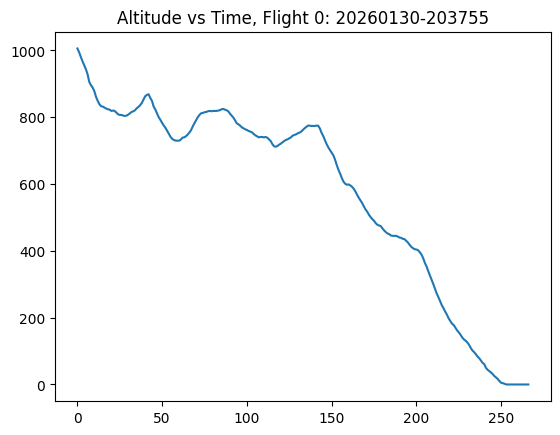

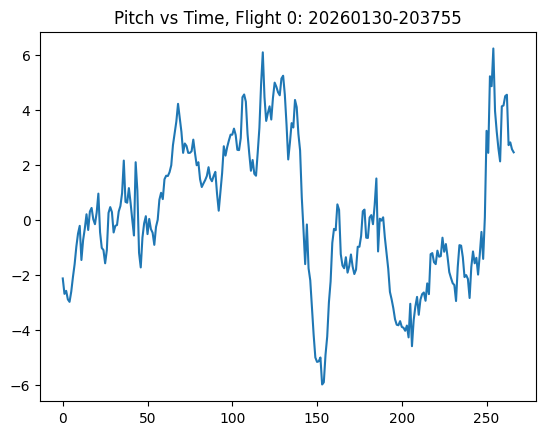

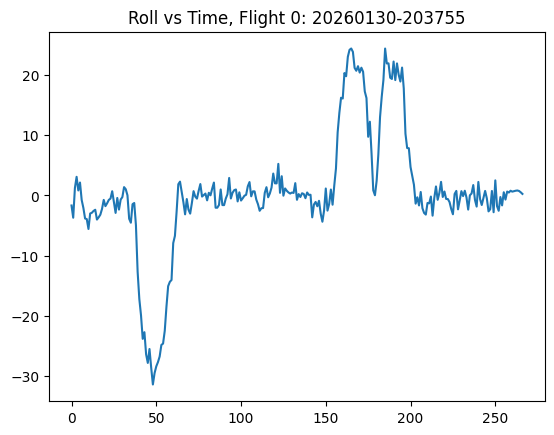

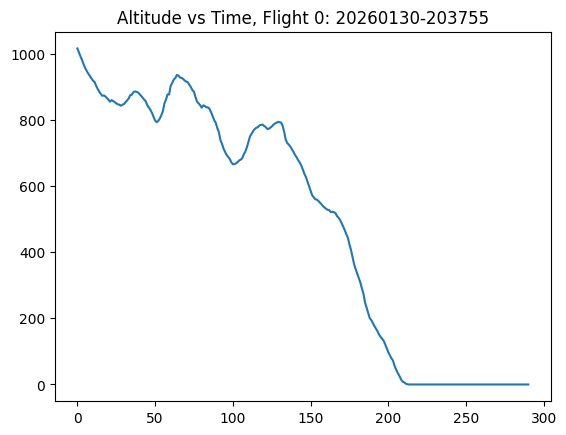

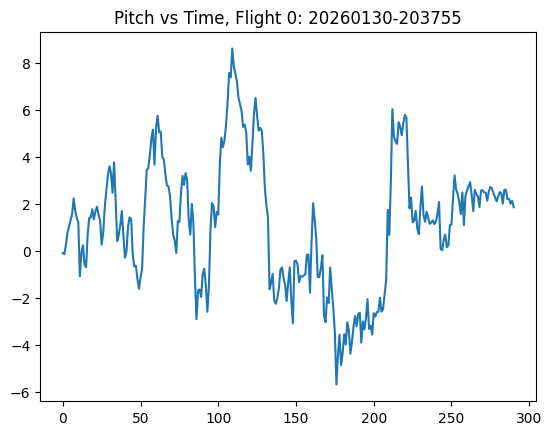

...

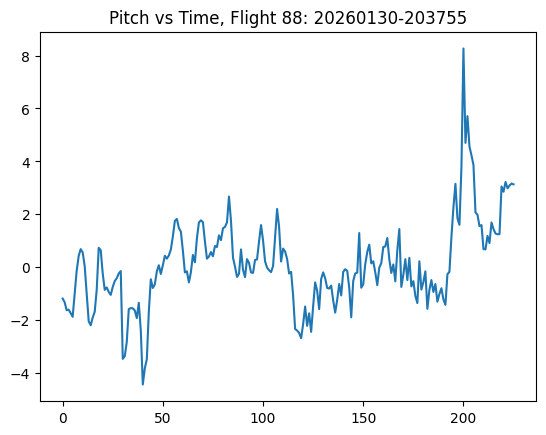

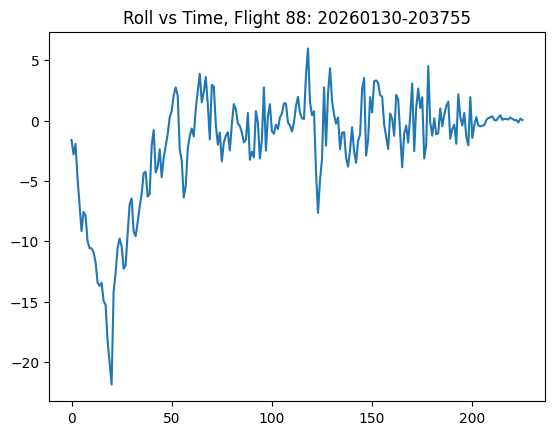

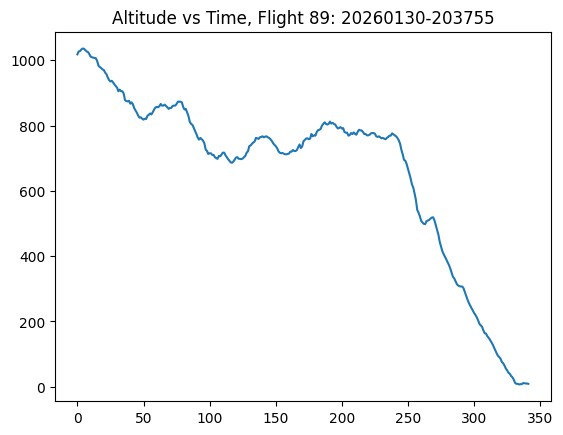

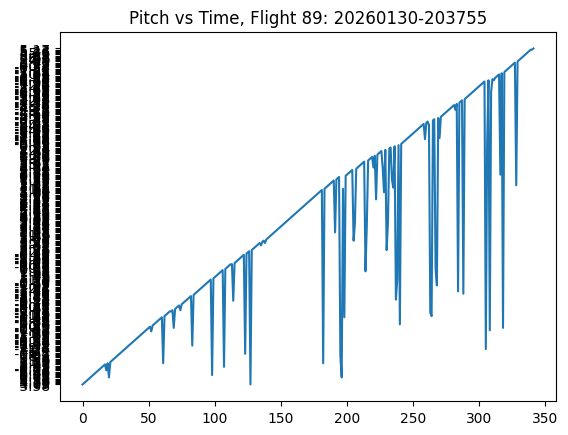

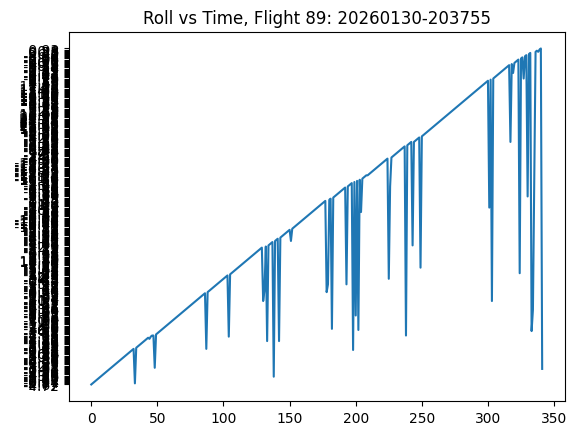

<Figure size 640x480 with 0 Axes>

In [108]:
files = glob.glob('../Figures/Empirical/Single_Batch/*')
for f in files:
    os.remove(f)

timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
for x in range(0,descentArray.__len__()):
    if(descentArray[x].__len__() > 0):
        os.mkdir('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures'.format(x))
    for descent in descentArray[x]:
        plt.plot(descent['AltAGL'])
        # plt.axis((25000,-5000,0,1500))
        plt.title("Altitude vs Time, Flight {}: {}".format(x,timestamp))
        plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Altitude_{}'.format(x,timestamp))
        plt.show()

        plt.plot(descent[' Pitch'])
        plt.title("Pitch vs Time, Flight {}: {}".format(x,timestamp))
        # plt.axis((25000,-5000,-20,20))
        plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Pitch_{}'.format(x,timestamp))
        plt.show()

        plt.plot(descent[' Roll'])
        plt.title("Roll vs Time, Flight {}: {}".format(x,timestamp))
        # plt.axis((25000,-5000,-20,20))
        plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Roll_{}'.format(x,timestamp))
        plt.show()

    plt.clf()

   

   

   

# Ideal Synthesis

In [75]:
## Calculate Average Columns
idealDescentArray = {'AltAGL': [[] for _ in range(1000)],
                     ' Pitch': [[] for _ in range(1000)],
                     ' Roll': [[] for _ in range(1000)],
                     ' CAS': [[] for _ in range(1000)],
                     ' IAS' : [[] for _ in range(1000)],
                     ' VSpd': [[] for _ in range(1000)],
                     ' GndSpd': [[] for _ in range(1000)],
                     ' HCDI': [[] for _ in range(1000)],
                     ' E1 RPM': [[] for _ in range(1000)],}
idealDescent = {'AltAGL': [0 for _ in range(1000)],
                ' Pitch': [0 for _ in range(1000)],
                ' Roll': [0 for _ in range(1000)],
                ' CAS': [0 for _ in range(1000)],
                ' IAS': [0 for _ in range(1000)],
                ' VSpd': [0 for _ in range(1000)],
                ' GndSpd': [0 for _ in range(1000)],
                ' HCDI': [0 for _ in range(1000)],
                ' E1 RPM': [0 for _ in range(1000)]}
for x in range(0,descentArray.__len__()):
    for descent in descentArray[x]:
        for time in range(0,descent.__len__()):
            for param in idealDescentArray.keys():
                if(param in descent):
                    idealDescentArray[param][time].append(float(descent[param][time]))
            # idealDescentArray['AltAGL'][time].append(float(descent['AltAGL'][time]))

for param in idealDescentArray.keys():
    for unit in range(0,idealDescentArray[param].__len__()):
        average = float(np.mean(idealDescentArray[param][unit]))
        idealDescent[param][unit] = average

# idealDescent[200]
# idealDescentArray['AltAGL'][200]






/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/.venv/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


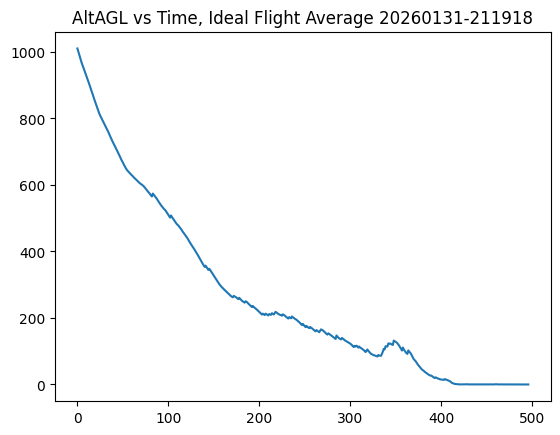

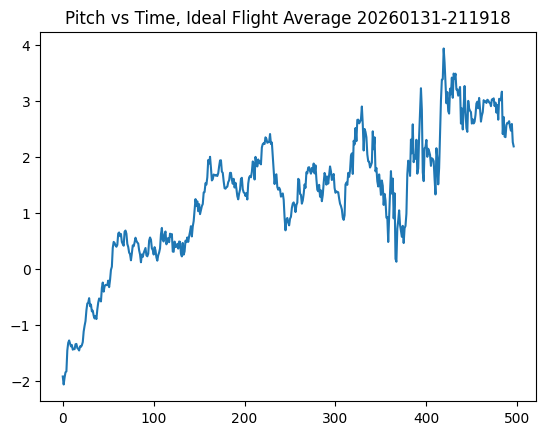

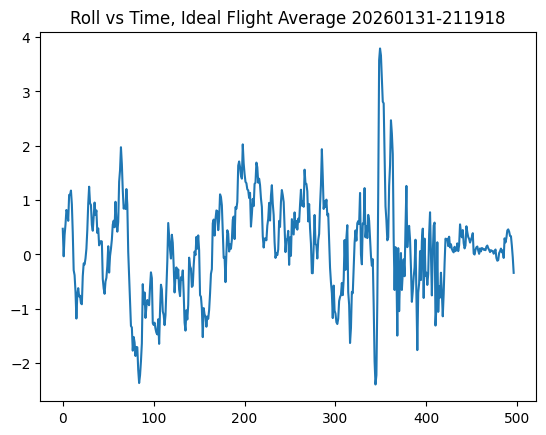

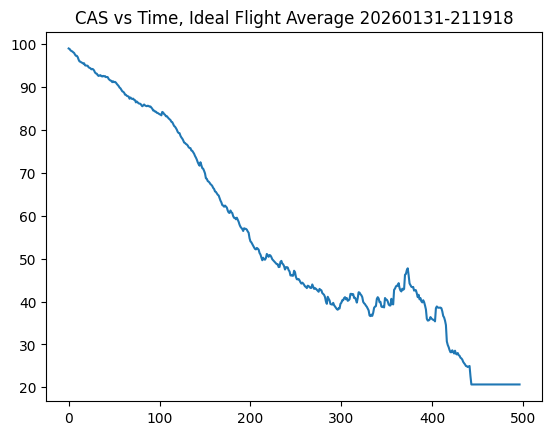

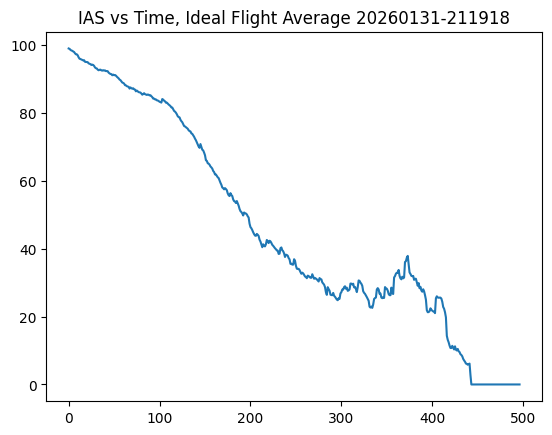

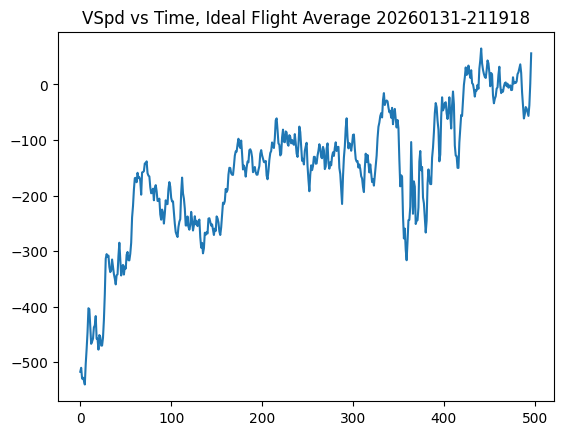

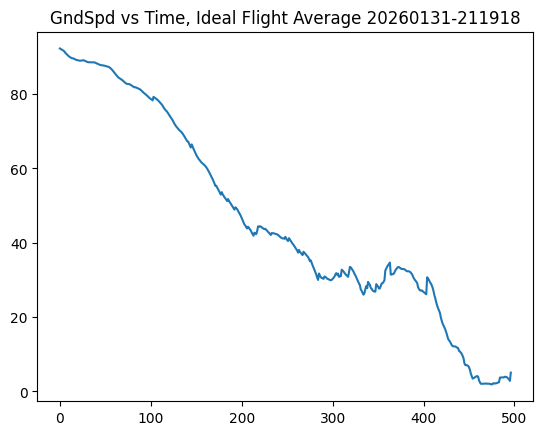

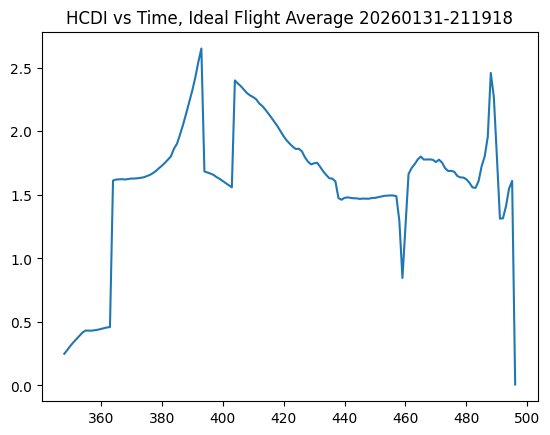

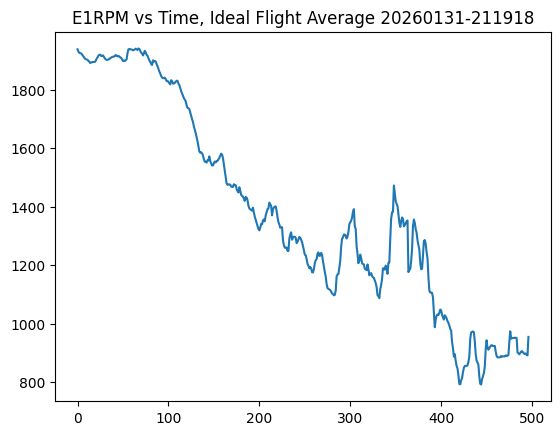

<Figure size 640x480 with 0 Axes>

In [76]:
files = glob.glob('../Figures/Empirical/Ideal_Synthesis/*')
for f in files:
    os.remove(f)

timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

for param in idealDescent.keys():
    plt.plot(idealDescent[param])
    # plt.axis((25000,-5000,0,1500))
    plt.title("{} vs Time, Ideal Flight Average {}".format(param.replace(' ', ''),timestamp))
    plt.savefig('../Figures/Empirical/Ideal_Synthesis/Ideal_{}_{}'.format(param.replace(' ', ''),timestamp))
    plt.show()
    plt.clf()

# plt.plot(idealDescent[' Pitch'])
# # plt.axis((25000,-5000,0,1500))
# plt.title("Pitch vs Time, Ideal Flight Average {}".format(timestamp))
# plt.savefig('../Figures/Empirical/Ideal_Synthesis/Ideal_Pitch_{}'.format(timestamp))
# plt.show()

# plt.plot(descent[' Pitch'])
# plt.title("Pitch vs Time, Flight {}: {}".format(x,timestamp))
# # plt.axis((25000,-5000,-20,20))
# plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Pitch_{}'.format(x,timestamp))
# plt.show()

# plt.plot(descent[' Roll'])
# plt.title("Roll vs Time, Flight {}: {}".format(x,timestamp))
# # plt.axis((25000,-5000,-20,20))
# plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Roll_{}'.format(x,timestamp))
# plt.show()

plt.clf()

# 0 Anchor Test 1

17 Files Loaded
MODEL DISTANCE IMAGE
Start: 0,982.7625675376399
Middle: 145,19.698901549 -- Speed: 24.570028
End: 156,0.32115814676
Index:145
Distance:2.758193386023044 NM, 16759.11399668234 FT
145
Max:98.90320025688
Min:44.284417092
MODEL DISTANCE IMAGE
Start: 0,821.53693245716
Middle: 101,23.8505256976 -- Speed: 29.606953
End: 117,0.21600066308000002
Index:101
Distance:1.9136663502423772 NM, 11627.666384034712 FT
101
Max:77.6222887484
Min:55.34378591696
MODEL DISTANCE IMAGE
Start: 0,1089.34901451796
Middle: 136,13.73173928456 -- Speed: 27.108505
End: 150,0.23728019132
Index:136
Distance:2.6030034479788005 NM, 15816.16131033295 FT
136
Max:88.79873797232
Min:44.91415904912
EMPIRICAL DISTANCE IMAGE
Start: 0,1018.0
Middle: 161,20.0 -- Speed: 66.3
End: 276,0.0
Index:161
Distance:3.2503375000000005 NM, 19749.440690500003 FT
161
Max:80.465
Min:58.34
EMPIRICAL DISTANCE IMAGE
Start: 0,1008.0
Middle: 128,19.0 -- Speed: 60.34
End: 141,0.0
Index:128
Distance:2.9509111111111115 NM, 17930.09002044

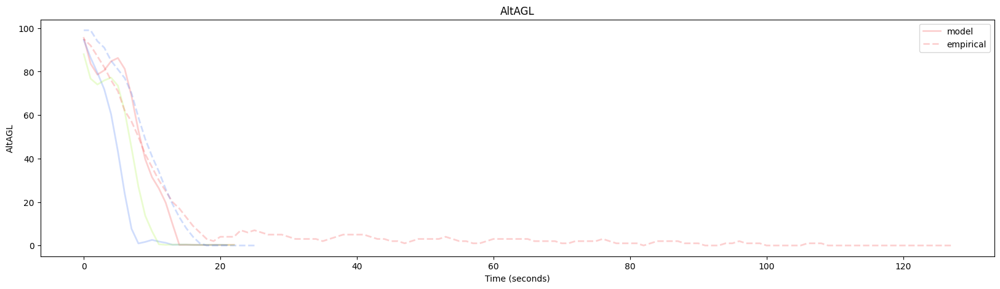

<Figure size 640x480 with 0 Axes>

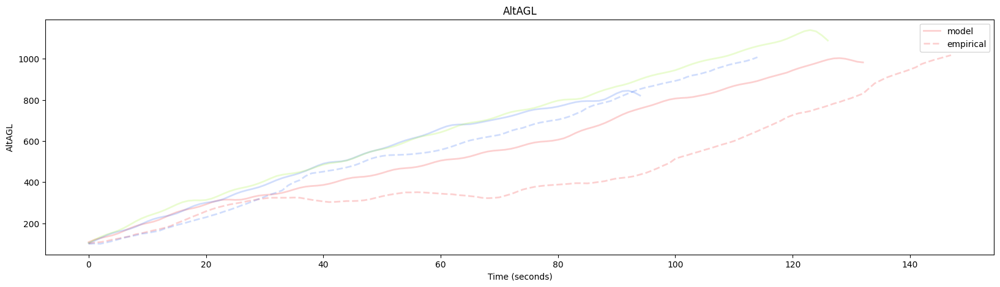

<Figure size 640x480 with 0 Axes>

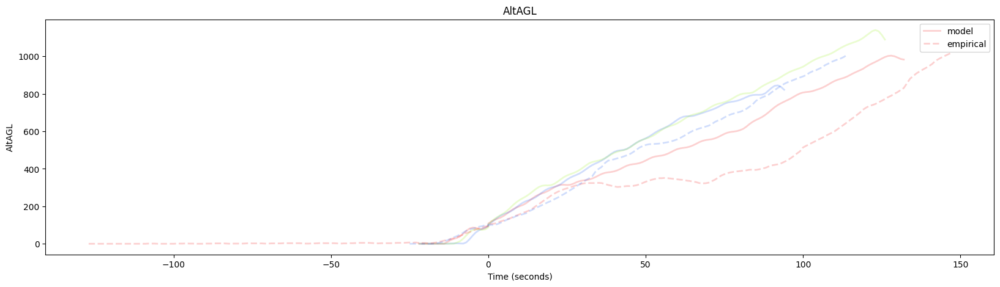

17 Files Loaded
MODEL DISTANCE IMAGE
Start: 0,982.7625675376399
Middle: 145,19.698901549 -- Speed: 24.570028
End: 156,0.32115814676
Index:145
Distance:2.758193386023044 NM, 16759.11399668234 FT
145
Max:98.90320025688
Min:44.284417092
MODEL DISTANCE IMAGE
Start: 0,821.53693245716
Middle: 101,23.8505256976 -- Speed: 29.606953
End: 117,0.21600066308000002
Index:101
Distance:1.9136663502423772 NM, 11627.666384034712 FT
101
Max:77.6222887484
Min:55.34378591696
MODEL DISTANCE IMAGE
Start: 0,1089.34901451796
Middle: 136,13.73173928456 -- Speed: 27.108505
End: 150,0.23728019132
Index:136
Distance:2.6030034479788005 NM, 15816.16131033295 FT
136
Max:88.79873797232
Min:44.91415904912
EMPIRICAL DISTANCE IMAGE
Start: 0,1018.0
Middle: 161,20.0 -- Speed: 66.3
End: 276,0.0
Index:161
Distance:3.2503375000000005 NM, 19749.440690500003 FT
161
Max:80.465
Min:58.34
EMPIRICAL DISTANCE IMAGE
Start: 0,1008.0
Middle: 128,19.0 -- Speed: 60.34
End: 141,0.0
Index:128
Distance:2.9509111111111115 NM, 17930.09002044

<Figure size 640x480 with 0 Axes>

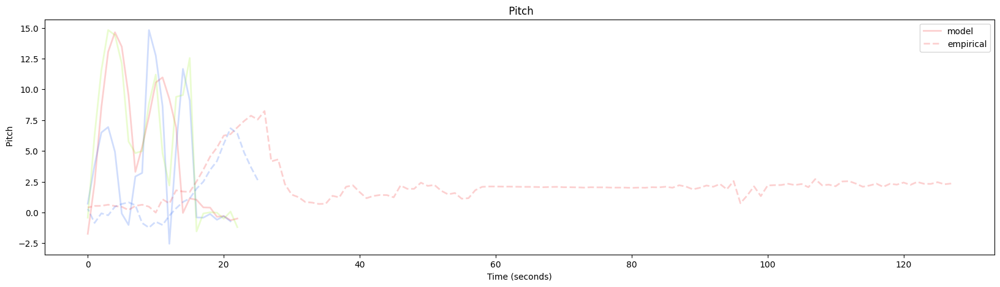

<Figure size 640x480 with 0 Axes>

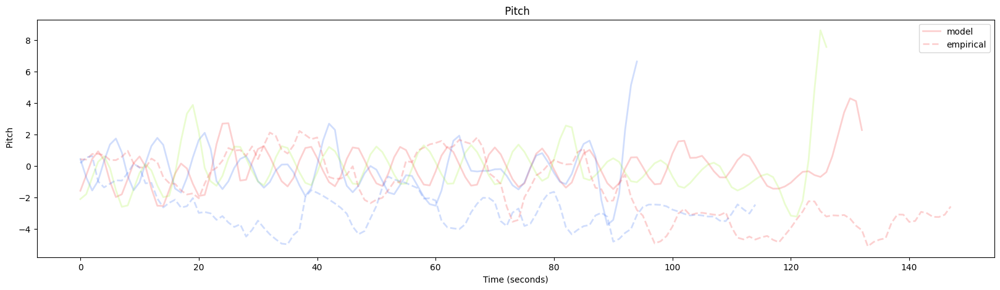

<Figure size 640x480 with 0 Axes>

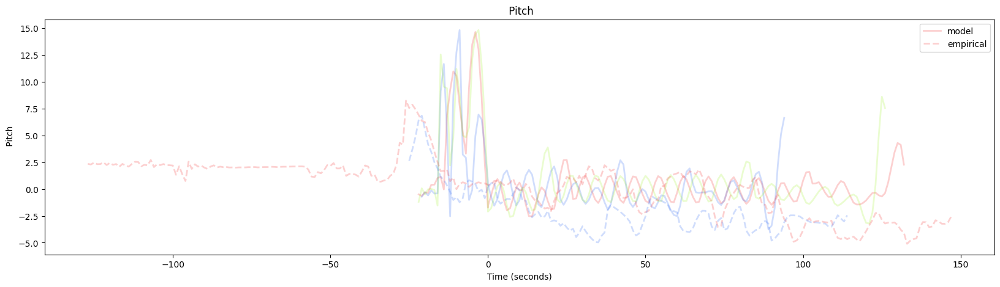

17 Files Loaded
MODEL DISTANCE IMAGE
Start: 0,982.7625675376399
Middle: 145,19.698901549 -- Speed: 24.570028
End: 156,0.32115814676
Index:145
Distance:2.758193386023044 NM, 16759.11399668234 FT
145
Max:98.90320025688
Min:44.284417092
MODEL DISTANCE IMAGE
Start: 0,821.53693245716
Middle: 101,23.8505256976 -- Speed: 29.606953
End: 117,0.21600066308000002
Index:101
Distance:1.9136663502423772 NM, 11627.666384034712 FT
101
Max:77.6222887484
Min:55.34378591696
MODEL DISTANCE IMAGE
Start: 0,1089.34901451796
Middle: 136,13.73173928456 -- Speed: 27.108505
End: 150,0.23728019132
Index:136
Distance:2.6030034479788005 NM, 15816.16131033295 FT
136
Max:88.79873797232
Min:44.91415904912
EMPIRICAL DISTANCE IMAGE
Start: 0,1018.0
Middle: 161,20.0 -- Speed: 66.3
End: 276,0.0
Index:161
Distance:3.2503375000000005 NM, 19749.440690500003 FT
161
Max:80.465
Min:58.34
EMPIRICAL DISTANCE IMAGE
Start: 0,1008.0
Middle: 128,19.0 -- Speed: 60.34
End: 141,0.0
Index:128
Distance:2.9509111111111115 NM, 17930.09002044

<Figure size 640x480 with 0 Axes>

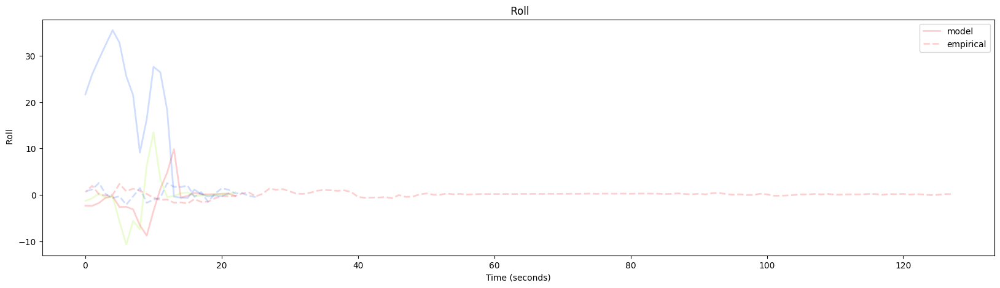

<Figure size 640x480 with 0 Axes>

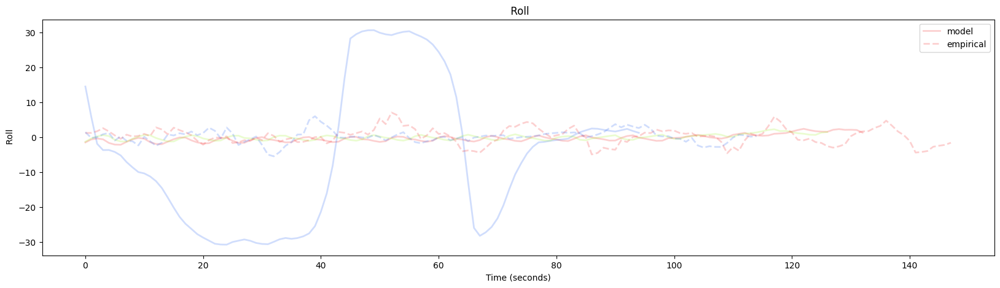

<Figure size 640x480 with 0 Axes>

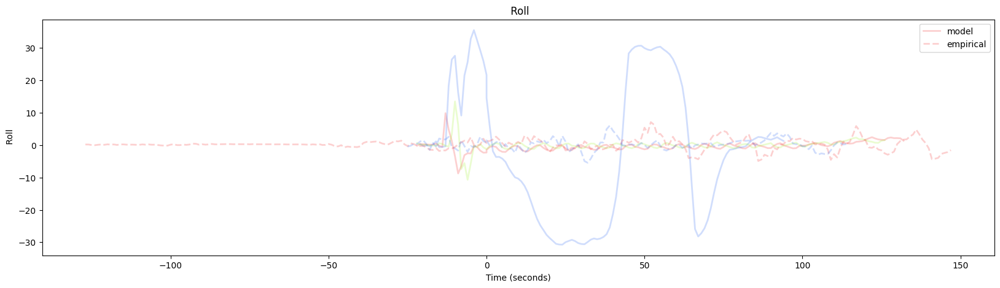

<Figure size 640x480 with 0 Axes>

In [8]:
# descent1 = descentArray[0][0]
# ax = plt.gca()
# ax2 = plt.twinx()


import colorsys
from copy import deepcopy
from enum import Enum

from numpy import copy


def utilizeModelData(useManual:bool = False):
    filePath = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/FollowCoords2--Turbulence Experiments 2026-02-14 14:10:32.404221"
    filePath2 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/Roll1--Turbulence Experiments 2026-02-13 13:03:32.478263/1_Roll1--Turbulence Experiments.csv"
    filePath3 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest1--Turbulence Experiments 2026-03-20 09:53:39.848992/{}_RecTest1--Turbulence Experiments.csv"
    filePath4 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest2--Turbulence Experiments 2026-03-20 09:59:21.064022/{}_RecTest2--Turbulence Experiments.csv"
    filePath5 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest3--Turbulence Experiments 2026-03-20 10:09:38.439818/{}_RecTest3--Turbulence Experiments.csv"
    filePath6 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest4--Turbulence Experiments 2026-03-20 10:16:14.758129/{}_RecTest4--Turbulence Experiments.csv"
    showcaseRun = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest6--Turbulence Experiments 2026-03-20 10:32:46.050711/{}_RecTest6--Turbulence Experiments.csv"
    showcaseRun2= "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/RecTest7--Turbulence Experiments 2026-03-20 10:36:47.246532/{}_RecTest7--Turbulence Experiments.csv"
    comparisonRuns = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/ComparisonRuns--Turbulence Experiments 2026-03-13 17:00:07.067204/{}_ComparisonRuns--Turbulence Experiments.csv"
    ex2 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/ex2--turbulence experiments 2026-04-13 01:20:57.181772/{}_ex2--turbulence experiments.csv"
    ex6 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/Ex6--turbulence experiments 2026-04-13 13:00:40.017013/{}_Ex6--turbulence experiments.csv"
    manualControl1 = "/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/ManualControl-1--turbulence experiments 2026-04-23 16:20:19.558488/{}_ManualControl-1--turbulence experiments.csv"
    modelData = [[]]
    for x in range (1,100):
        try:
            # data = pd.read_csv('/Users/flyingtopher/Developer/Code Citadel/School/2. Research/AviationThesis/Project_Data/Data_Storage/ComparisonRuns--Turbulence Experiments 2026-03-13 17:00:07.067204/{}_ComparisonRuns--Turbulence Experiments.csv'.format(x))
            # data = pd.read_csv(comparisonRuns.format(x))
            # data = pd.read_csv(showcaseRun.format(x))
            data = pd.read_csv(ex6.format(x))
            if (useManual):
                data = pd.read_csv(manualControl1.format(x))

            modelData[0].append(data)
        except FileNotFoundError:
            print("{} Files Loaded".format(x-1))
            return modelData
            break
        else:
            # Continue Loop
            continue
            
        

## Empirical Descent Array Shape: (Multiple loops  through the out loop to get everything)
# [0] = [0][1]
# [1] = [0]
# [2] = [0][1][2]
## Model Descent Array Shape:
# [0] = [0][1][2][3][4]...[100] (Only one loop through the outer loop)
## Modification #2:
# Adjust analyzeParameter Fuction to take in all inputs it needs;

def get_color(count):
    hue = (count * 0.61803398875) % 1  # golden ratio spacing
    r, g, b = colorsys.hsv_to_rgb(hue, 0.9, 0.95)

    return (
        r,
        g,
        b
    )

def analyzeParameter(parameter,dataArray):
    index = 0
    currentParameter = parameter
    coarseArrays = []
    fineArrays = []
    combinedArrays = []
    anchorPoint = 100
    for data in dataArray: ## Each data will have the same columns, so it should work as if analyzeParamter was called individually for each of them at this stage
        coarseArrays.append([])
        fineArrays.append([])
        combinedArrays.append([])
        for i1 in range(0,data.__len__()):
            for i2 in range(0,data[i1].__len__()):
                descent1 = data[i1][i2]
                if ' VCDI' in descent1 or 'Cycle Time' in descent1:
                    # print("FOUND VCDI")
                    if 'Cycle Time' in descent1: ## METERS TO FEET CONVERSION 
                        descent1['AltAGL'] = descent1['AltAGL'] * 3.28084
                    for x,y in zip(descent1['AltAGL'],descent1[' Pitch']):
                        if x < anchorPoint:
                            if 'Cycle Time' in descent1:
                                print("MODEL DISTANCE IMAGE")
                                distanceImage(descent1,True)
                            elif True:
                                print("EMPIRICAL DISTANCE IMAGE")
                                distanceImage(descent1,False)
                            descent1Coarse = descent1[0:index]
                            descent1CoarseIndex = descent1Coarse.index
                            descent1Coarse= descent1Coarse.iloc[::-1]
                            descent1Coarse.index = descent1CoarseIndex
                            coarseArrays[-1].append(descent1Coarse[currentParameter].astype(float))

                            # print(descent1['AltAGL'][index-1])
                            descent1Fine = descent1[index:]
                            descent1Fine = descent1Fine.reset_index()
                            descent1Fine = descent1Fine.iloc[::-1]
                            fineArrays[-1].append(descent1Fine[currentParameter].astype(float))

                            descent1Fine.index = descent1Fine.index * -1
                            descent1Combined = pd.concat([descent1Fine[currentParameter].astype(float), descent1Coarse[currentParameter].astype(float)],axis=0)
                            combinedArrays[-1].append(descent1Combined)

                            descent1 = None
                            index = 0
                            break
                        index+=1

    idealDescent = []
    targetArrays = [fineArrays,coarseArrays,combinedArrays]
    counter = 0

    ## Summary Statistics
    maxPitchTiming = []
    rolloutTiming = []
    minValue = 1000
    minValueIndex = 0
    maxValue = -1000
    maxValueIndex = 0
    averages = []
    avg = 0


    summaryStatistics(currentParameter,targetArrays)
    ## New Attempt:
    colors = [["red",'model','-',],["blue","empirical","--"],"green","orange"]
    for target_list in targetArrays:
        plt.figure(figsize=(20,5))
        for i, targetData in enumerate(target_list):
            idealDescent= []
            color = colors[i % len(colors)][0]
            label = colors[i % len(colors)][1]
            lineStyle = colors[i % len(colors)][2]
            counter = False
            average = 0
            totalVal = 0
            count = 0
            colorCount = 0

            for landing in targetData:
                # for i in range(0,200):
                #     if(i < landing.__len__()):
                #             totalVal+=float(landing[i])
                #             count+=1
                if(not counter):
                    plt.plot(landing, color=get_color(colorCount), alpha=0.2,label=label,linestyle=lineStyle,linewidth=2,) #Color Label
                    colorCount +=1 
                    counter = True
                elif(counter):
                    plt.plot(landing, color=get_color(colorCount), alpha=0.2,linestyle=lineStyle,linewidth=2) #No Color Label 
                    colorCount +=1



            # if(count > 0):
            #         average = totalVal/count
            #         idealDescent.insert(i,average)

        # plt.gca().invert_xaxis()
        plt.title(currentParameter)
        plt.ylabel(currentParameter)
        plt.xlabel("Time (seconds)")
        plt.legend()
        plt.show()
        plt.clf()

    # innerCounter = 0
    # for targetArrayList in targetArrays: ## for List of fine adjustment for each dataset in fine,coarse,combined list 
    #     for targetArray in targetArrayList: ## for fine adjustment for dataset X in list of datasets x, y, z
    #         # print(targetArray.__len__())
    #         minIndex = 0
    #         maxIndex = 300
    #         if(counter == 0):
    #             minIndex = 0
    #             maxIndex = 300
    #         elif(counter == 1):
    #             minIndex = 0
    #             maxIndex = 300
    #         elif(counter == 2):
    #             minIndex = 0
    #             maxIndex = 0

    #         ##Graph Plotting    
    #         # for i in range(minIndex,maxIndex):
    #         #     totalVal = 0
    #         #     count = 0
    #         #     for x in range(0,
    #         #                 #    1
    #         #                 targetArray.__len__()
    #         #                 ):
    #         #         # print(x,"/",targetArray.__len__())
    #         #         if(i < targetArray[x].__len__()):
    #         #             totalVal += float(targetArray[x][i])
    #         #             count+=1
    #         #     if(count > 0):
    #         #         average = totalVal/count
    #         #         idealDescent.insert(i,average)

    #         # plt.axis((None,None,-10,10))
    #         activeOverlay = True
    #         plt.figure().set_figwidth(20)
    #         # plt.yticks(np.arange(min(idealDescent,default=0), max(idealDescent,default=0), 100))
    #         if(activeOverlay):
    #             for overlay in range(0,targetArrayList[counter].__len__()):  
    #                 plt.plot(targetArrayList[counter][overlay], color=colors[counter],alpha=0.2)

    #         # plt.plot(idealDescent,linewidth=4)

    #         if(counter == 0):
    #             plt.gca().invert_xaxis()
    #             plt.title("Fine Adjustment: {}".format(currentParameter))
    #             plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
    #         elif(counter == 1):
    #             plt.title("Coarse Adjustment: {}".format(currentParameter))
    #             plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
    #         elif(counter == 2):
    #             plt.title("Combined Adjustment: {}".format(currentParameter))
    #             plt.axvline(x=0, color='b', linestyle='--', linewidth=2)
    #             plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
    # plt.show()
    # plt.clf()
    # idealDescent=[]
    # counter+=1


class targetArrayAccess(Enum):
    FINE = 0
    COARSE = 1
    COMBINED = 2
class statisticsAccess(Enum):
    perSecondAvg = 0
    perMinuteAvg = 1

## DESCENT LEVEL STATISTICS FUNCTIONS
def averageDescentRate(descent): ## Individual Descent Level Function -- Add conditions/return packages as new situations are encountered
    if(descent.__len__() > 0):
        avgDescentRatePerSecond = (descent[max(descent.__len__()-1,0)]-descent[0])/max(descent.__len__()-1,0)
        print("Avg Rate of Descent Per Second: {}".format(avgDescentRatePerSecond))
        avgDescentRatePerMinute = 0
        counter = 0
        if(descent.__len__() > 60):
            for i in range(1,descent.__len__()-60):
                avgDescentRatePerMinute+=(descent[max(descent.__len__()-i,0)]-descent[max(descent.__len__()-i-60,0)])
            counter+=1
            avgDescentRatePerMinute = (avgDescentRatePerMinute/counter)/60
        print("Avg Rate of Descent Per Minute: {}".format(avgDescentRatePerMinute))

def averagePitchVariationPerSecond(descent):
    avgPitchFluctuation = 0
    if(descent.__len__() > 0):
        if(descent.__len__() > 60):
            counter = 0
            for i in range(0,descent.__len__()-2):
                avgPitchFluctuation+= descent[i] - descent[i+1]
                counter +=1
            avgPitchFluctuation = avgPitchFluctuation/counter
            print("Average Pitch Fluctuations Per Second: {}".format(avgPitchFluctuation))
            return(avgPitchFluctuation)

def averageRollVariationPerSecond(descent):
    avgRollFluctuation = 0
    if(descent.__len__() > 0):
        if(descent.__len__() > 60):
            counter = 0
            for i in range(0,descent.__len__()-2):
                avgRollFluctuation+= descent[i] - descent[i+1]
                counter +=1
            avgRollFluctuation = avgRollFluctuation/counter
            print("Average Roll Fluctuations Per Second: {}".format(avgRollFluctuation))
            return(avgRollFluctuation)

def avgPercentageOfMax(descent,currentParameter):
      if(descent.__len__() > 0):
        maximum = max(descent)
        print("Max: {}".format(maximum))
        avgPercentageOfMax = 0
        counter = 0
        for i in range(0,descent.__len__()):
            #  print("Percentage of Max")
            avgPercentageOfMax += descent[i]/maximum
            counter +=1
        avgPercentageOfMax = avgPercentageOfMax/counter
        print("Avg Percentage of Max for {}: {}".format(currentParameter,avgPercentageOfMax))
        return(avgPercentageOfMax)

def avgPercentageOfMinimum(descent,currentParameter):
     if(descent.__len__() > 0):
        minimum = min(descent)
        print("Min: {}".format(minimum))
        avgPercentageOfMin = 0
        counter = 0
        for i in range(0,descent.__len__()):
            #  print("Percentage of Max")
            avgPercentageOfMin += descent[i]/minimum
            counter+=1
        avgPercentageOfMin = avgPercentageOfMin/counter
        print("Avg Percentage of Min for {}: {}".format(currentParameter,avgPercentageOfMin))

def totalTime(descent):
     print("Total Time In Seconds: {}".format(descent.__len__()))



def distanceImageVelocity(descent, convert):

    if ' GndSpd' in descent and ' HDG' in descent:

        index = 0
        for i in range(len(descent)):
            if descent['AltAGL'][i] < 10:
                index = i
                break

        totalX_nm = 0.0
        totalY_nm = 0.0

        for i in range(0, index):

            s1 = float(descent[' GndSpd'][i])
            s2 = float(descent[' GndSpd'][i+1])

            if convert:
                s1 *= 1.94384
                s2 *= 1.94384

            avgS = (s1 + s2) / 2

            heading_deg = float(descent[' HDG'][i])
            heading_rad = math.radians(heading_deg)

            d_nm = avgS / 3600.0

            dx = d_nm * math.cos(heading_rad)
            dy = d_nm * math.sin(heading_rad)

            totalX_nm += dx
            totalY_nm += dy

        # Distance (magnitude)
        distance_nm = math.sqrt(totalX_nm**2 + totalY_nm**2)

        # Direction (bearing)
        bearing_rad = math.atan2(totalY_nm, totalX_nm)
        bearing_deg = (math.degrees(bearing_rad) + 360) % 360

        print("Distance:", distance_nm, "NM")
        print("Bearing:", bearing_deg, "deg")

        return [distance_nm, bearing_deg]
# def distanceImage(descent, convert):

#     if ' GndSpd' in descent and 'Heading' in descent:

#         index = 0
#         for i in range(len(descent)):
#             if descent['AltAGL'][i] < 25:
#                 index = i
#                 break

#         totalX_nm = 0.0
#         totalY_nm = 0.0

#         for i in range(0, index):

#             s1 = float(descent[' GndSpd'][i])
#             s2 = float(descent[' GndSpd'][i+1])

#             if convert:
#                 s1 *= 1.94384
#                 s2 *= 1.94384

#             avgS = (s1 + s2) / 2

#             heading_deg = float(descent['Heading'][i])
#             heading_rad = math.radians(heading_deg)

#             d_nm = avgS / 3600

#             dx = d_nm * math.cos(heading_rad)
#             dy = d_nm * math.sin(heading_rad)

#             totalX_nm += dx
#             totalY_nm += dy

#         totalDistance_nm = math.sqrt(totalX_nm**2 + totalY_nm**2)
#         totalDistance_ft = totalDistance_nm * 6076.12

#         print("Displacement:", totalDistance_nm, "NM")
#         print("Feet:", totalDistance_ft)

#         return totalDistance_nm

def distanceImage(descent,convert):
    if ' GndSpd' in descent:
        index = 0
        for i in range (0,descent.__len__()):
            if(descent['AltAGL'][i] < 25):
                index = i
                print("Start: {},{}".format(0,descent['AltAGL'][0]))
                print("Middle: {},{} -- Speed: {}".format(index,descent['AltAGL'][index],descent[' GndSpd'][index]))
                print("End: {},{}".format(descent.__len__(),descent['AltAGL'][descent.__len__()-1]))
                break
        
        totalDistanceNauticalMiles = 0
        totalDistanceFeet = 0
        count = 0
        prevMax = -1000
        prevMin = 1000
        print("Index:{}".format(index))
        for i in range(0,index):
            s1 = float(descent[' GndSpd'][i])
            s2 = float(descent[' GndSpd'][i+1])
            if convert:
                s1= s1 * 1.94384
                s2=s2 * 1.94384

            avgS = (s1+s2)/2
            # print(avgS)
            # print(avgS)
            prevMax = max(prevMax,avgS)
            prevMin = min(prevMin,avgS)

            # print(avgS)
            dPerSec = (avgS/3600)
            totalDistanceNauticalMiles+= dPerSec
            count+=1
            totalDistanceFeet = totalDistanceNauticalMiles * 6076.12
        print("Distance:{} NM, {} FT".format(totalDistanceNauticalMiles,totalDistanceFeet))
        print(count)
        print("Max:{}".format(prevMax))
        print("Min:{}".format(prevMin))
        return totalDistanceNauticalMiles
        
        


def summaryStatistics(currentParameter, targetArrays):
    fineArrays = deepcopy(targetArrays[targetArrayAccess.FINE.value])
    coarseArrays = deepcopy(targetArrays[targetArrayAccess.COARSE.value])
    for dataPack in coarseArrays:
        print("NEW DATAPACK")
        for descent in dataPack:
            totalTime(descent)
            avgPercentageOfMax(descent,currentParameter)
            avgPercentageOfMinimum(descent,currentParameter)

            match (currentParameter):
                case "AltAGL":
                    # Fine Analysis
                    #Coarse Analysis
                    averageDescentRate(descent)
                case " Pitch":
                    averagePitchVariationPerSecond(descent)
                case " Roll":
                    averageRollVariationPerSecond(descent)

            #[Fine, Coarse, Combined]
            #[Data1, Data2, Data3]
            #[Descent1, descent2, Descent3, Descent4]


    # if currentParameter == ' Pitch':  # Summary Statistics for Pitch
    #     for landings in targetArrays[1]:
    #         for landing in landings:
    #             for i in range(0,landing.__len__()):
    #                 ##From start of pitch phase 
    #                 if(i < landing.__len__()):
    #                     if(float(landing[i]) < minValue or minValue == None):
    #                         minValue = landing[i]
    #                         minValueIndex = i
    #                     if(float(landing[i]) > maxValue or maxValue == None):
    #                         maxValue = landing[i]
    #                         maxValueIndex = i
    #             formattedTiming = "{}/{}:{}".format(minValueIndex,maxValueIndex,maxValueIndex-minValueIndex)
    #             rawDifference = maxValueIndex-minValueIndex
    #             maxPitchTiming.append(rawDifference)
    #             for i in range(maxValueIndex,landing.__len__()):
    #                 if(landing[i] <= minValue or minValue == None):
    #                         minValue = landing[i]
    #                         minValueIndex = i
    #             formattedTiming= "{}/{}:{}".format(minValueIndex,maxValueIndex,maxValueIndex-minValueIndex)
    #             rawDifference = maxValueIndex-minValueIndex
    #             rolloutTiming.append(rawDifference)
    #         print("Averages for Flare Duration:{}".format(maxPitchTiming))
    #         print("Average Flare Duration:{}".format(np.mean(maxPitchTiming)))

    #     for landings in targetArrays[1]:
    #         for landing in landings:
    #             mean = np.mean(landing)
    #             deviations = landing-mean
    #             # print("Deviations")
    #             # print(mean)
    #             averages.append(mean)
    #         avg = np.mean(averages)
        # print(rolloutTiming)
    print()

# parameterList = ['AltAGL',' Pitch',' Roll',' VSpd',' IAS',' GndSpd',' HCDI',' E1 RPM']
parameterList = ['AltAGL',' Pitch',' Roll']
# parameterList = ['AltAGL', 'Pitch']
for parameter in parameterList:
    modelData = deepcopy(utilizeModelData())
    empiricalData = deepcopy(descentArray)
    # analyzeParameter(parameter,[[[modelData[0][0]]],[empiricalData[6]]])
    analyzeParameter(parameter,[[modelData[0][0:3]],empiricalData[6:12]])
    # analyzeParameter(parameter,[modelData,empiricalData[1:10]])

# Creating Experiment Setup Files

In [ ]:
import csv
file = open("../../Project_Code/Python3Model/src/experiments/weather_files/experimentSetup.csv","w")

csv_writer = csv.writer(file)

csv_writer.writerow([
  "turbulence experiments",
  "Cognitive Delay",
  "reference_latitude",
  "reference_longitude",
  "reference_radial",
  "distance",
  "altitude_agl",
  "x_velocity",
  "y_velocity",
  "z_velocity",
  "p_rotation",
  "q_rotation",
  "r_rotation",
  "heading",
  "wind_altitude",
  "wind_direction",
  "wind_speed",
  "turbulence_level",
  "velocity_initial",
  "fuel_level"
])

csv_writer.writerow(
    [
  "null",
  "null",
  "null",
  "null",
  "null",
  "null",
  "null",
  "sim/flightmodel/position/local_vx",
  "sim/flightmodel/position/local_vy",
  "sim/flightmodel/position/local_vz",
  "sim/flightmodel/position/P",
  "sim/flightmodel/position/Q",
  "sim/flightmodel/position/R",
  "sim/flightmodel/position/q",
  "sim/weather/wind_altitude_msl_m[0]",
  "sim/weather/wind_direction_degt[0]",
  "sim/weather/wind_speed_kt[0]",
  "sim/weather/turbulence[0]",
  "sim/flightmodel/position/local_vz",
  "sim/flightmodel/weight/m_fuel"
]
)

def getAverageWindDirection(landing):
    total = 0
    for i in range(0,landing.__len__()):
        if ' WndDr' in landing:
            wd_rel = float(landing[' WndDr'][i])
            hdg_mag = float(landing[' HDG'][i])
            mag_var = float(landing[' MagVar'][i])  # east positive

            hdg_true = hdg_mag + mag_var
            wd_true = (wd_rel + hdg_true) % 360

            total += wd_true
            # # total+=float(landing[' WndDir'][i])
            # total+=float(landing[' WndDr'][i])
    return total/landing.__len__()

def getAverageWindSpeed(landing):
    total = 0
    for i in range(0,landing.__len__()):
        if ' WndSpd' in landing:
            # total+=float(landing[' WndDir'][i])
            total+=float(landing[' WndSpd'][i])
    return total/landing.__len__()


def getInitialVelocity(landing):
    if ' GndSpd' in landing:
        return landing[' GndSpd'][0]
    
def getInitialAltitudeAGL(landing):
    if 'AltAGL' in landing:
        return landing['AltAGL'][0]

def getInitialHeading(landing):
    if ' HDG' in landing:
        return landing[' HDG'][0]
    
def getAverageDescentRate(landing):
    if 'AltAGL' in landing:
        return ((landing['AltAGL'][landing.__len__()-1] - landing['AltAGL'][0])/landing.__len__()) * 60


count = 0
for descent in descentArray:
    for landing in descent:
        result = distanceImageVelocity(landing,False)
        cognitive_delay = 0.15
        lat = 39.875027
        long = -104.696482
        radial = 359
        distance = result[0]
        altitude_agl = getInitialAltitudeAGL(landing)-200
        x_velocity = 0
        y_velocity = 0
        z_velocity = 0
        p_rotation = 0
        q_rotation = 0
        r_rotation = 0
        heading = 179
        wind_altitude = 0
        wind_direction = getAverageWindDirection(landing)
        wind_speed = getAverageWindSpeed(landing) 
        turbulence_level = 0
        velocity_initial = getInitialVelocity(landing)
        fuel_level = 20
        average_descent_rate = getAverageDescentRate(landing)
        
        csv_writer.writerow([
            count,
            cognitive_delay,
            lat,
            long,
            radial,
            distance,
            altitude_agl,
            x_velocity,
            y_velocity,
            z_velocity,     
            p_rotation,
            q_rotation,
            r_rotation,
            heading,
            wind_altitude,
            wind_direction,
            wind_speed,
            turbulence_level,
            velocity_initial,
            fuel_level,
        ])
        count+=1
file.close()

Distance: 2.982775015505134 NM
Bearing: 224.91832666344888 deg
Distance: 0.43825274095345623 NM
Bearing: 252.01759852017818 deg
Distance: 4.587896092308574 NM
Bearing: 235.1827323865361 deg
Distance: 4.380953135736078 NM
Bearing: 245.20885637268324 deg
Distance: 3.033257612197004 NM
Bearing: 44.08955265237853 deg
Distance: 3.3029707342027272 NM
Bearing: 174.54898689011907 deg
Distance: 4.029740134831729 NM
Bearing: 225.9202967652078 deg
Distance: 3.243720716265803 NM
Bearing: 136.07457866708512 deg
Distance: 2.9827384761555726 NM
Bearing: 175.33875270026238 deg
Distance: 3.1838140409859252 NM
Bearing: 359.78451021881483 deg
Distance: 3.1047825844102714 NM
Bearing: 266.20664045397785 deg
Distance: 3.2862166316594497 NM
Bearing: 0.3010018768545706 deg
Distance: 0.21903471344982575 NM
Bearing: 323.61801483056377 deg
Distance: 2.830635333066114 NM
Bearing: 182.79299311140232 deg
Distance: 3.027102892574508 NM
Bearing: 174.72550883257213 deg
Distance: 0.7734407676053833 NM
Bearing: 295.8388

# Pre Adjustment analyze parameter Function

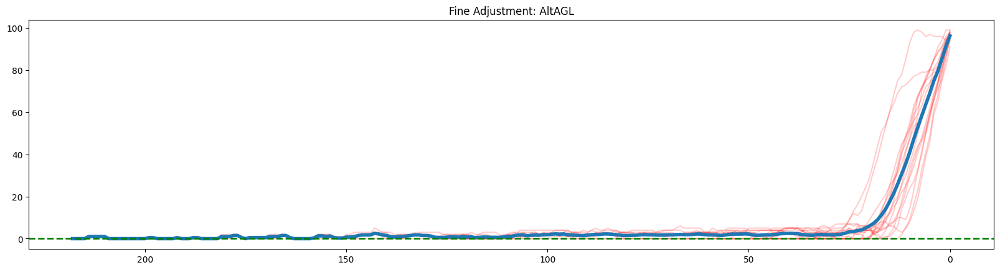

<Figure size 640x480 with 0 Axes>

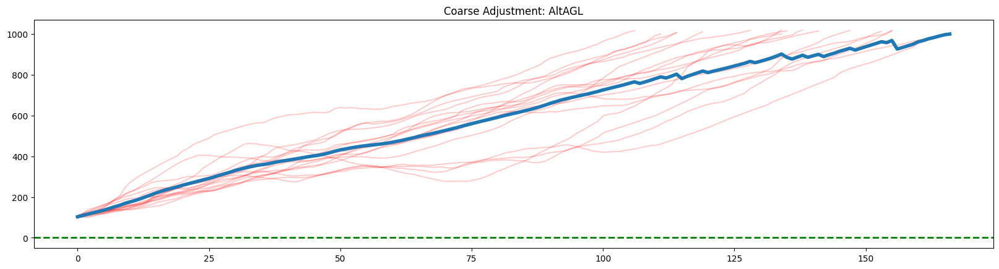

<Figure size 640x480 with 0 Axes>

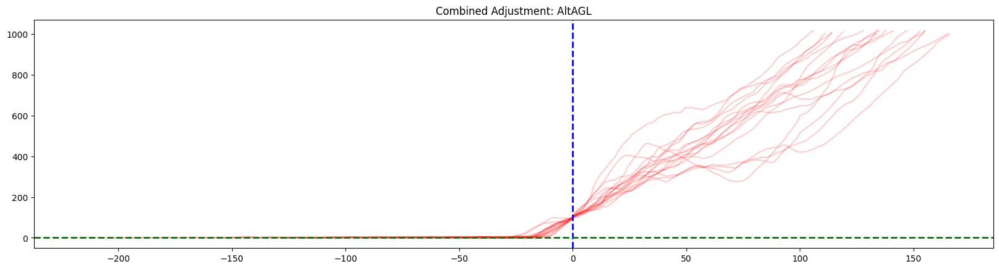

<Figure size 640x480 with 0 Axes>

In [212]:
def analyzeParameter(parameter,data):
    index = 0
    currentParameter = parameter
    coarseArray = []
    fineArray = []
    combinedArray= []
    anchorPoint = 100

    for i1 in range(0,data.__len__()):
        for i2 in range(0,data[i1].__len__()):
            descent1 = data[i1][i2]
            if ' VCDI' in descent1 or 'Cycle Time' in descent1:
                # print("FOUND VCDI")
                for x,y in zip(descent1['AltAGL'],descent1[' Pitch']):
                    if x < anchorPoint:
                        descent1Coarse = descent1[0:index]
                        descent1CoarseIndex = descent1Coarse.index
                        descent1Coarse= descent1Coarse.iloc[::-1]
                        descent1Coarse.index = descent1CoarseIndex
                        coarseArray.append(descent1Coarse[currentParameter].astype(float))

                        # print(descent1['AltAGL'][index-1])
                        descent1Fine = descent1[index:]
                        descent1Fine = descent1Fine.reset_index()
                        descent1Fine = descent1Fine.iloc[::-1]
                        fineArray.append(descent1Fine[currentParameter].astype(float))

                        descent1Fine.index = descent1Fine.index * -1
                        # descent1Fine = descent1Fine.reset_index()
                        # print(descent1Fine.index)
                        descent1Combined = pd.concat([descent1Fine[currentParameter].astype(float), descent1Coarse[currentParameter].astype(float)],axis=0)
                        combinedArray.append(descent1Combined)

                        # descent1Index = descent1.index
                        # descent1.index = descent1Index
                        # print(descent1['AltAGL'][index-1])
                        # ax.plot(descent1Coarse['AltAGL'])
                        # plt.plot(descent1['AltAGL'])
                        # ax2.plot(descent1Coarse[' Pitch'],color="orange")
                        # plt.axis((None,None,None,None))
                        # plt.title("Altitude vs Time, Flight {}: {}".format(x,timestamp))
                        # plt.savefig('../Figures/Empirical/Single_Batch/{}_Empirical_Flight_Figures/Altitude_{}'.format(x,timestamp))
                        descent1 = None
                        index = 0
                        break
                    index+=1
            # print(index)
    # plt.show()

    idealDescent = []
    targetArrays = [fineArray,coarseArray,combinedArray]
    counter = 0

    ## Summary Statistics
    maxPitchTiming = []
    rolloutTiming = []
    minValue = 1000
    minValueIndex = 0
    maxValue = -1000
    maxValueIndex = 0
    averages = []
    avg = 0

    if currentParameter == ' Pitch':  # Summary Statistics for Pitch
        for landing in targetArrays[1]:
            for i in range(0,landing.__len__()):
                ##From start of pitch phase 
                if(i < landing.__len__()):
                    if(float(landing[i]) < minValue or minValue == None):
                        minValue = landing[i]
                        minValueIndex = i
                    if(float(landing[i]) > maxValue or maxValue == None):
                        maxValue = landing[i]
                        maxValueIndex = i
            formattedTiming = "{}/{}:{}".format(minValueIndex,maxValueIndex,maxValueIndex-minValueIndex)
            rawDifference = maxValueIndex-minValueIndex
            maxPitchTiming.append(rawDifference)
            for i in range(maxValueIndex,landing.__len__()):
                if(landing[i] <= minValue or minValue == None):
                        minValue = landing[i]
                        minValueIndex = i
            formattedTiming= "{}/{}:{}".format(minValueIndex,maxValueIndex,maxValueIndex-minValueIndex)
            rawDifference = maxValueIndex-minValueIndex
            rolloutTiming.append(rawDifference)
        print("Averages for Flare Duration:{}".format(maxPitchTiming))
        print("Average Flare Duration:{}".format(np.mean(maxPitchTiming)))

        for landing in targetArrays[1]:
            mean = np.mean(landing)
            deviations = landing-mean
            # print("Deviations")
            # print(mean)
            averages.append(mean)
        avg = np.mean(averages)
        # print(rolloutTiming)

    
    if currentParameter == ' Roll':  # Summary Statistics for Roll
        for landing in targetArrays[1]:
            mean = np.mean(landing)
            deviations = landing-mean
            # print("Deviations")
            # print(mean)
            averages.append(mean)
        avg = np.mean(averages)

    if currentParameter == ' IAS' or currentParameter == ' Vspd':  # Summary Statistics for Roll
        for landing in targetArrays[1]:
            mean = np.mean(landing)
            deviations = landing-mean
            # print("Deviations")
            # print(mean)
            averages.append(mean)
        avg = np.mean(averages)


    for targetArray in targetArrays:
        minIndex = 0
        maxIndex = 300
        if(counter == 0):
            minIndex = 0
            maxIndex = 300
        elif(counter == 1):
            minIndex = 0
            maxIndex = 300
        elif(counter == 2):
            minIndex = 0
            maxIndex = 0

        ##Graph Plotting    
        for i in range(minIndex,maxIndex):
            totalVal = 0
            count = 0
            for x in range(0,
                        #    1
                        targetArray.__len__()
                        ):
                # print(x,"/",targetArray.__len__())
                if(i < targetArray[x].__len__()):
                    totalVal += float(targetArray[x][i])
                    count+=1
            if(count > 0):
                average = totalVal/count
                idealDescent.insert(i,average)


    

        # plt.axis((None,None,-10,10))
        activeOverlay = True
        plt.figure().set_figwidth(20)
        # plt.yticks(np.arange(min(idealDescent,default=0), max(idealDescent,default=0), 100))
        if(activeOverlay):
            for overlay in range(0,targetArrays[counter].__len__()):  
                plt.plot(targetArrays[counter][overlay], color="red",alpha=0.2)
        plt.plot(idealDescent,linewidth=4)

        plt.title("Coarse Adjustment: {}".format(currentParameter))
        if(counter == 0):
            plt.gca().invert_xaxis()
            plt.title("Fine Adjustment: {}".format(currentParameter))
            plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
        elif(counter == 1):
            plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
        elif(counter == 2):
            plt.title("Combined Adjustment: {}".format(currentParameter))
            plt.axvline(x=0, color='b', linestyle='--', linewidth=2)
            plt.axhline(y=avg, color='g', linestyle='--', linewidth=2)
        plt.show()
        plt.clf()
        idealDescent=[]
        counter+=1


analyzeParameter('AltAGL',deepcopy(descentArray))

# Windrose Test

267 267
267 267


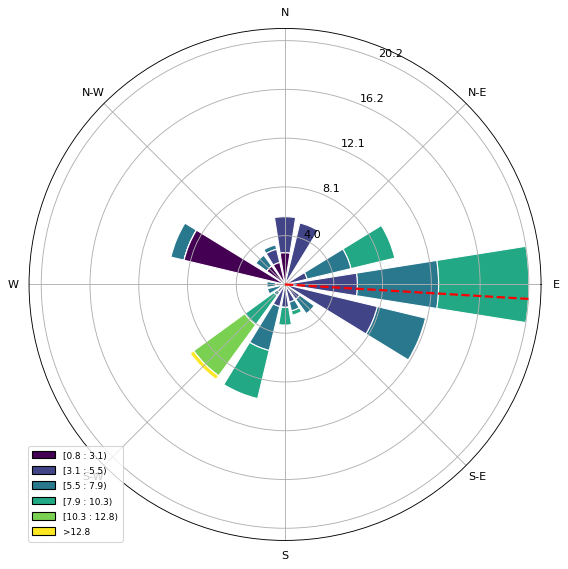

291 267
291 267


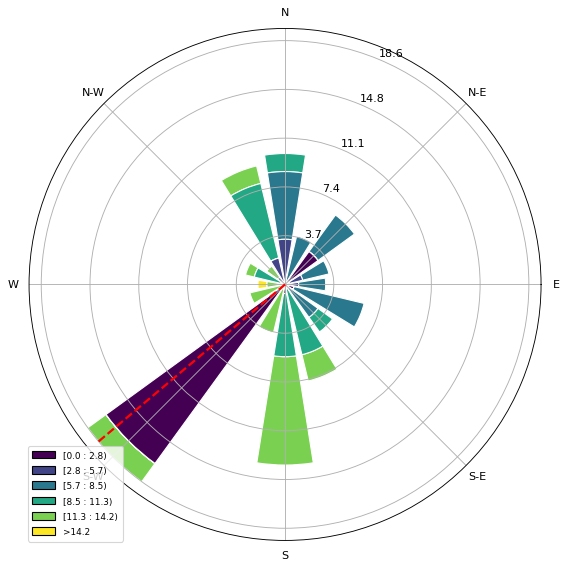

364 364
364 364


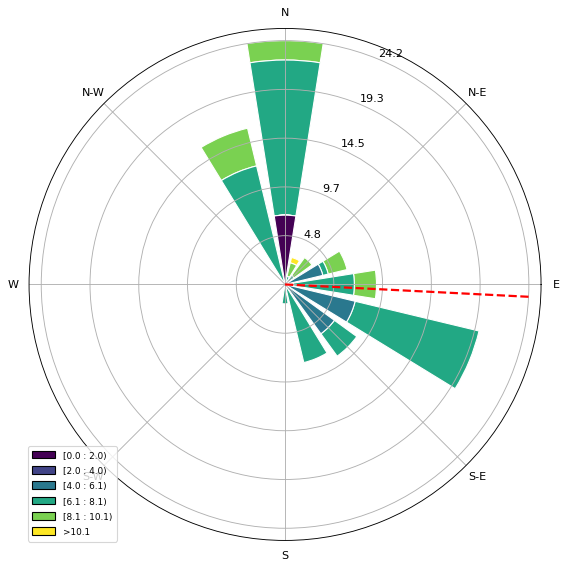

336 336
336 336


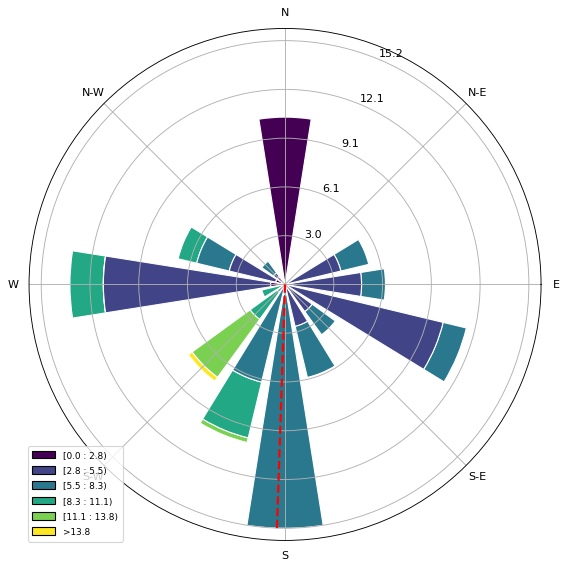

358 358
358 358


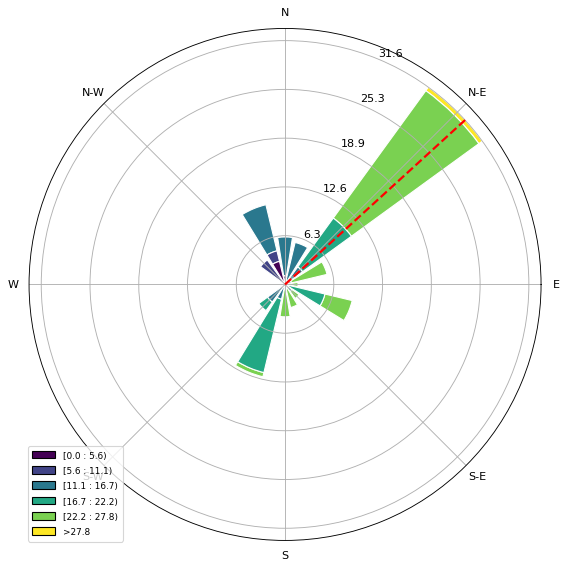

276 276
276 276


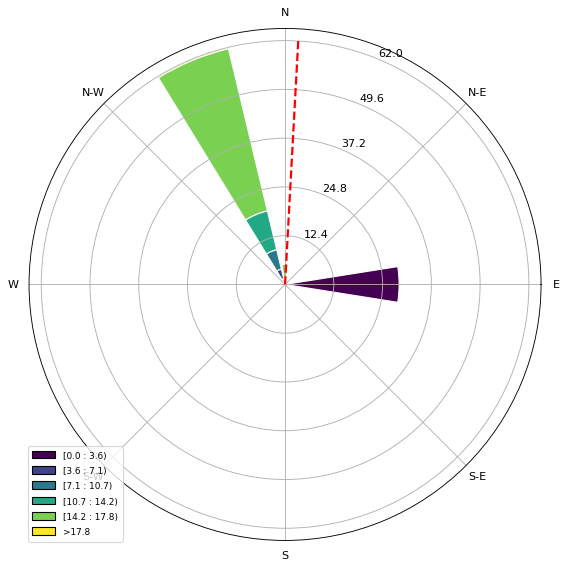

252 252
252 252


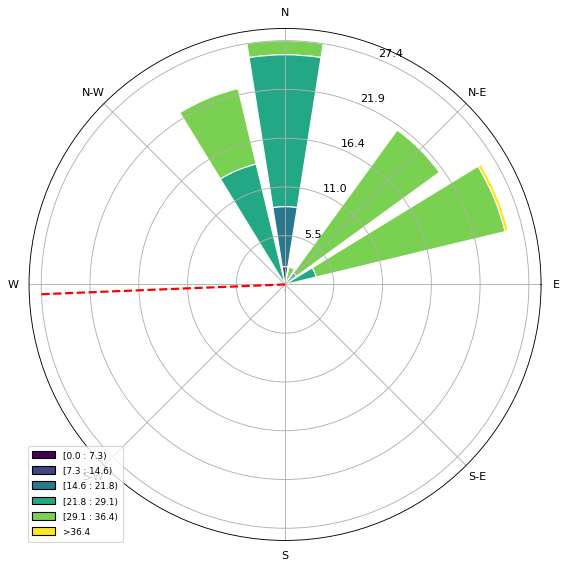

214 214
214 214


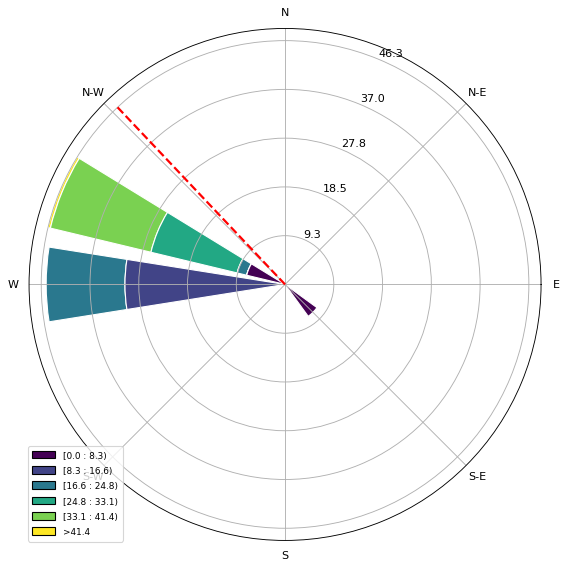

141 141
141 141


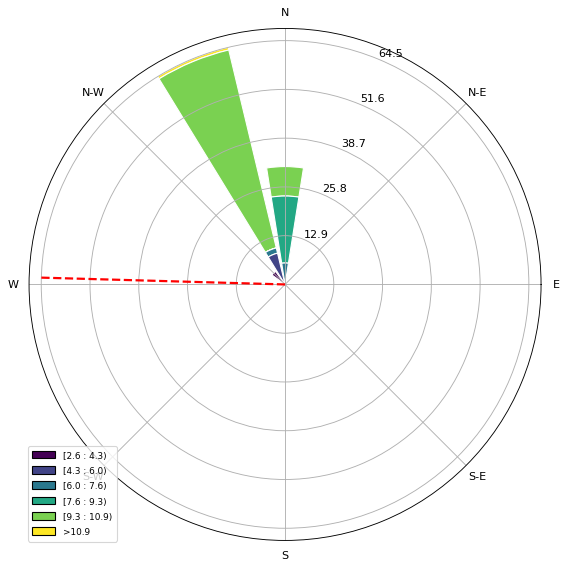

348 348
348 348


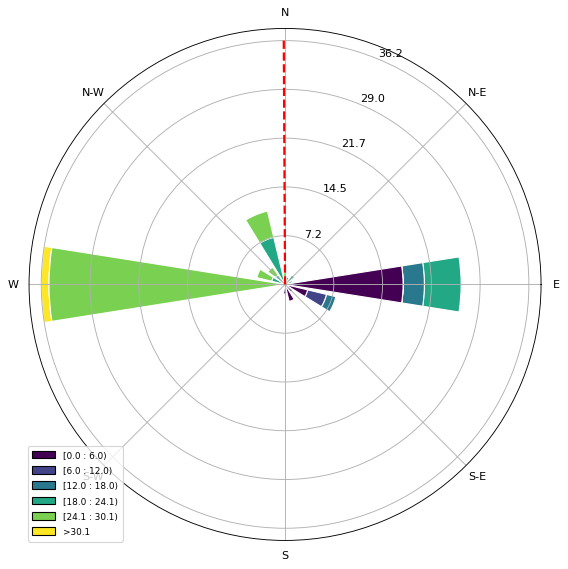

268 268
268 268


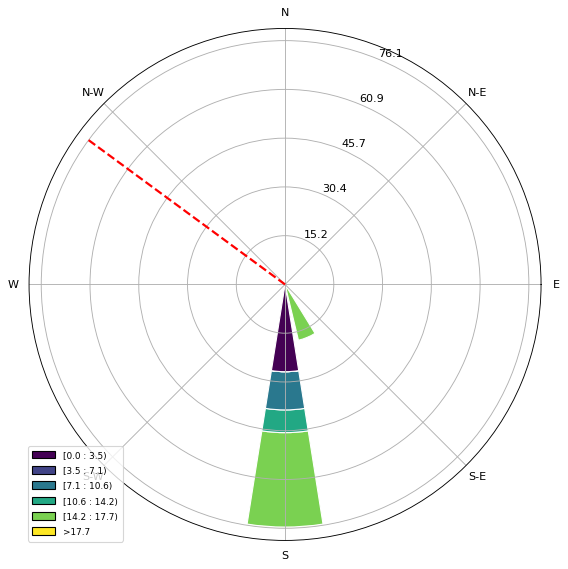

217 217
217 217


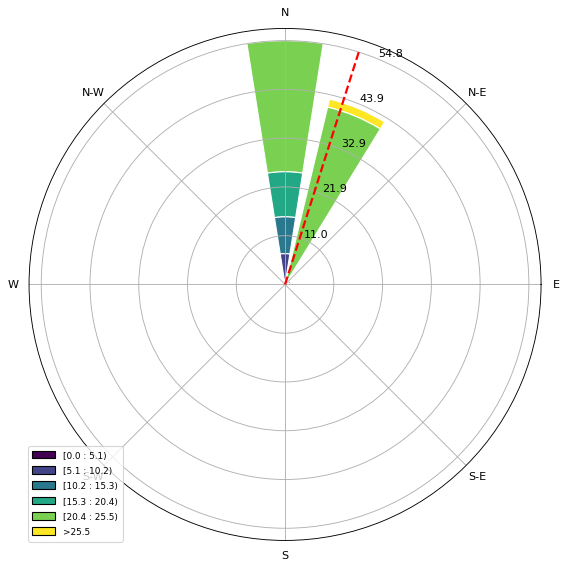

263 263
263 263


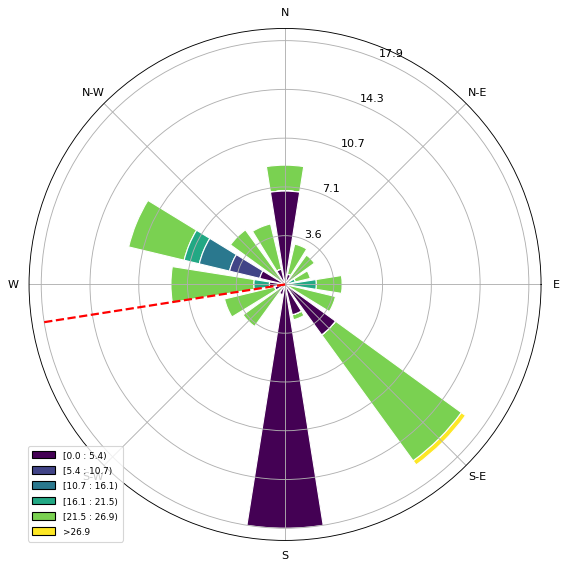

207 207
207 207


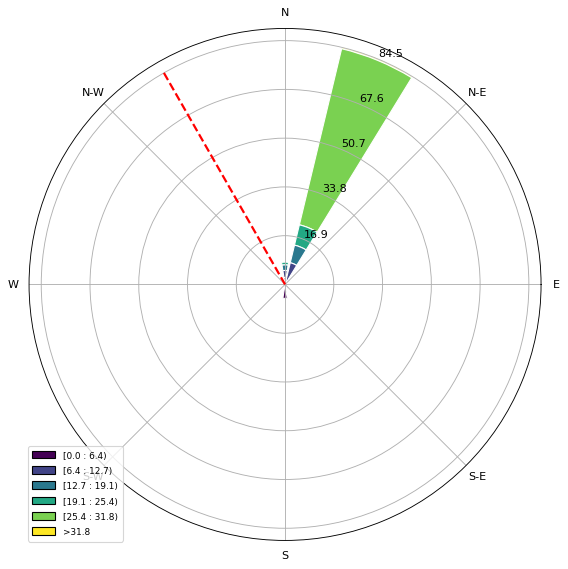

285 285
285 285


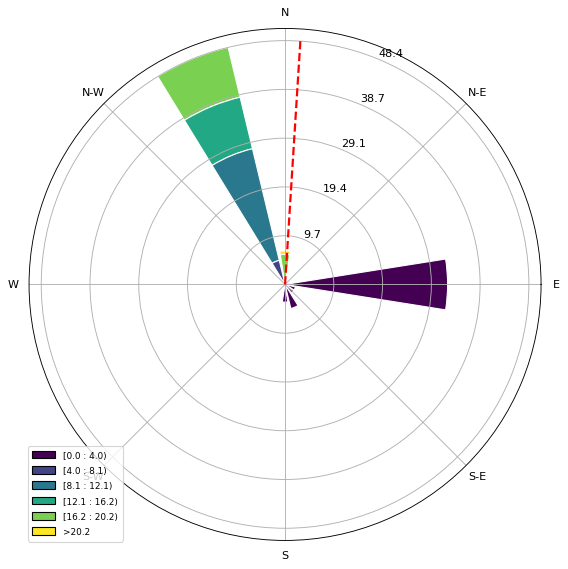

394 394
394 394


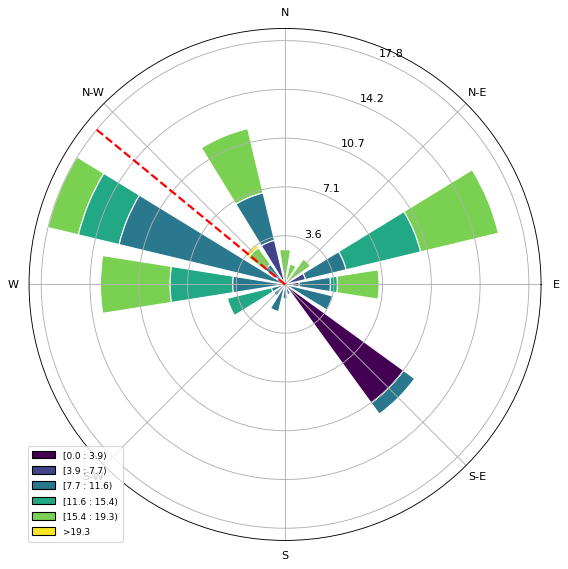

305 305
305 305


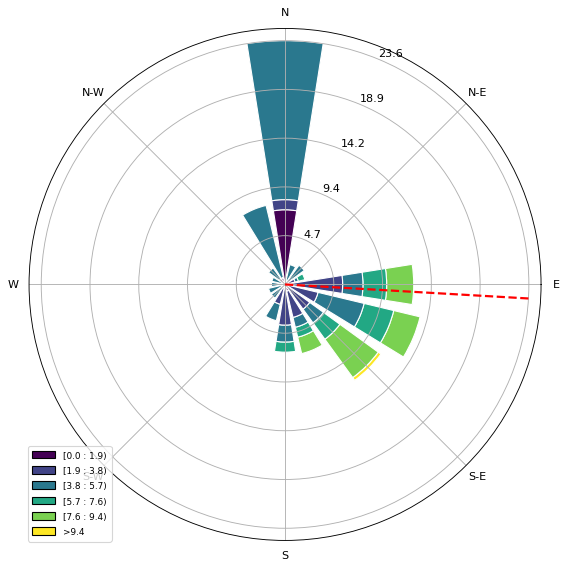

233 233
233 233


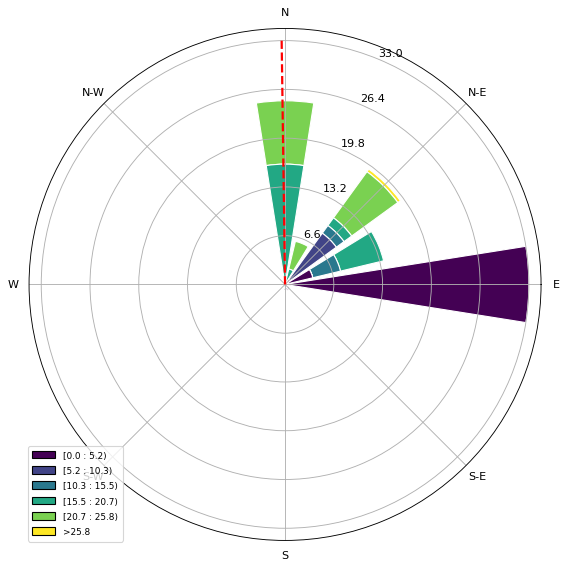

497 497
497 497


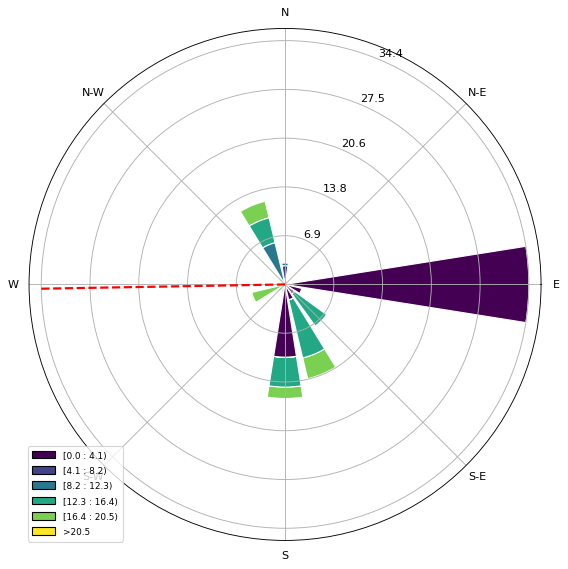

339 339
339 339


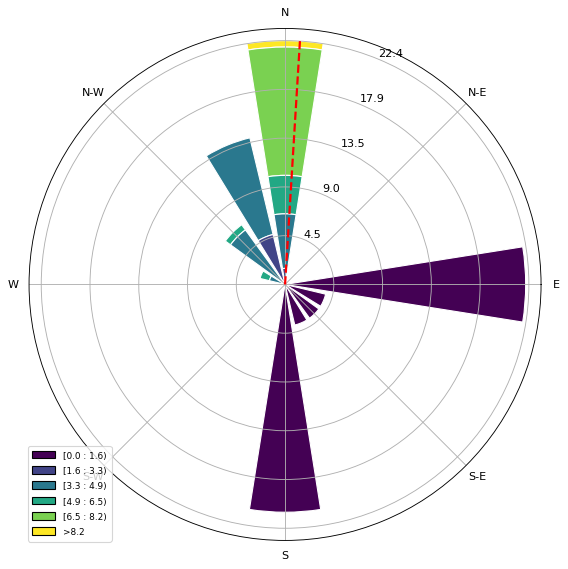

172 172
172 172


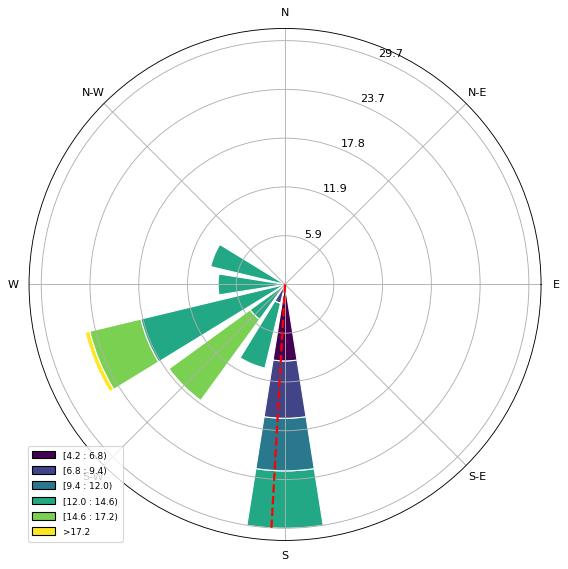

307 307
307 307


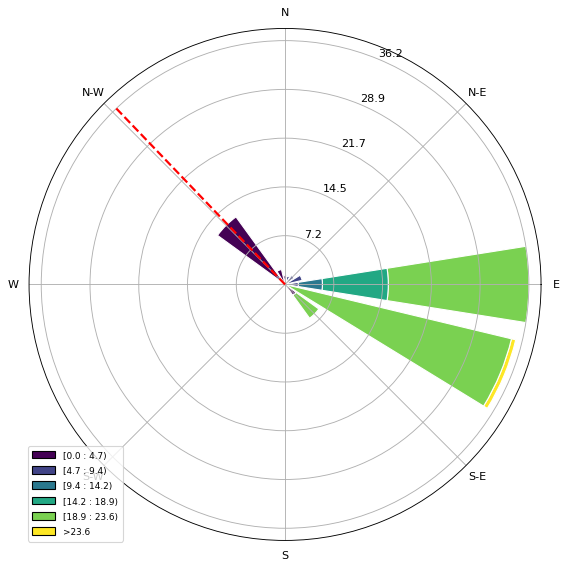

331 331
331 331


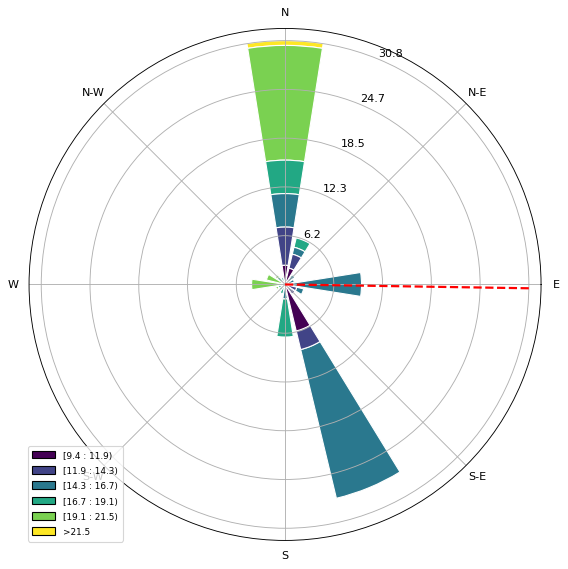

193 193
193 193


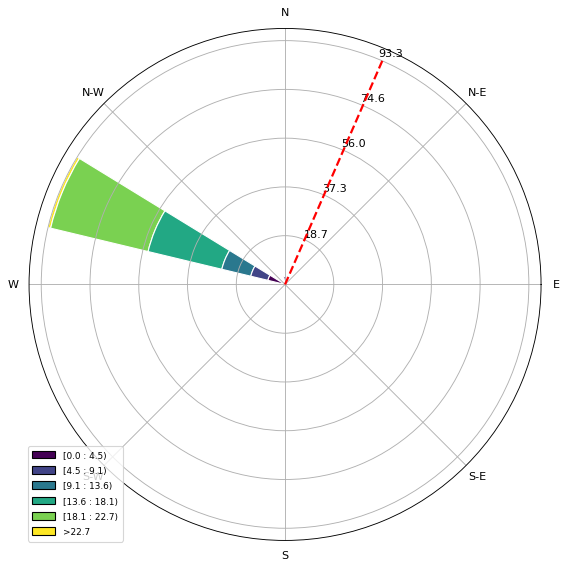

496 496
496 496


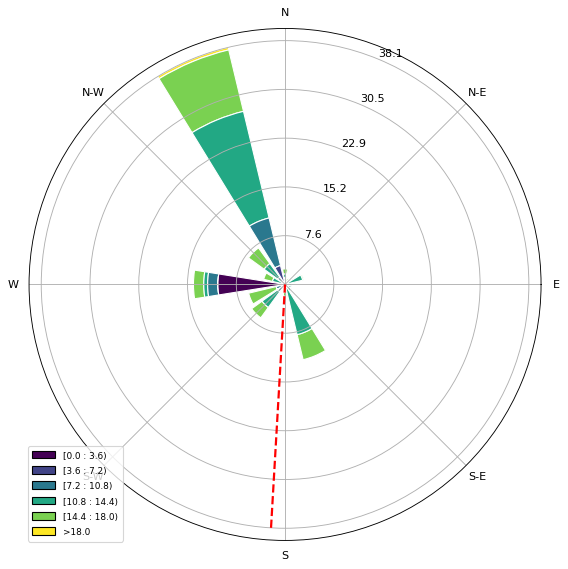

256 256
256 256


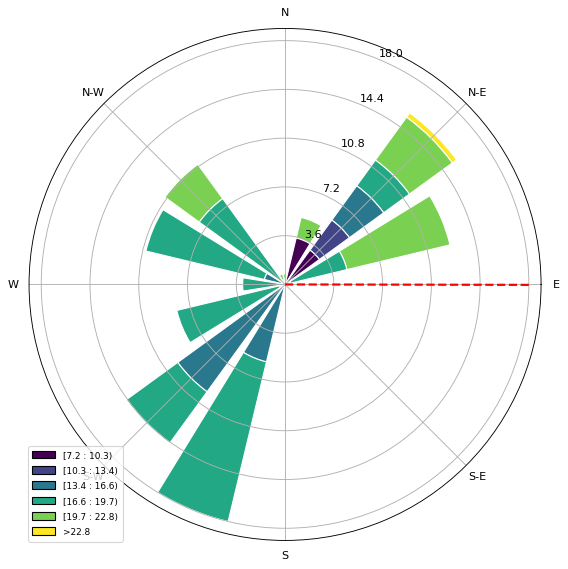

248 248
248 248


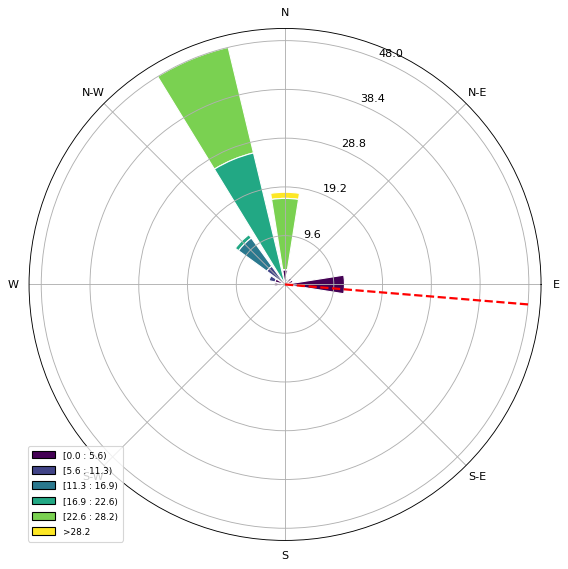

484 484
484 484


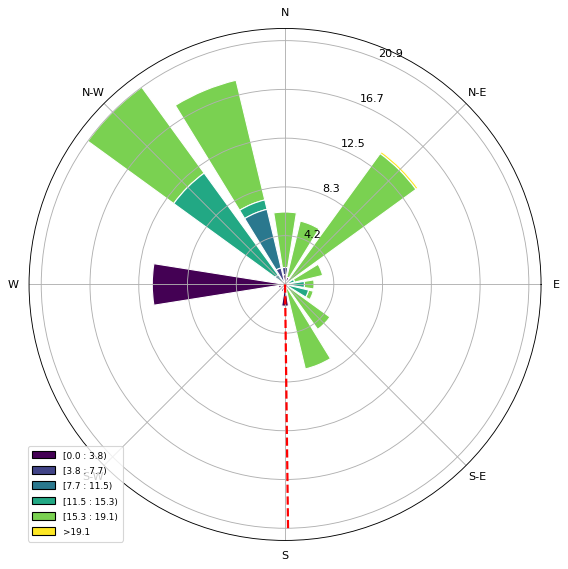

236 236
236 236


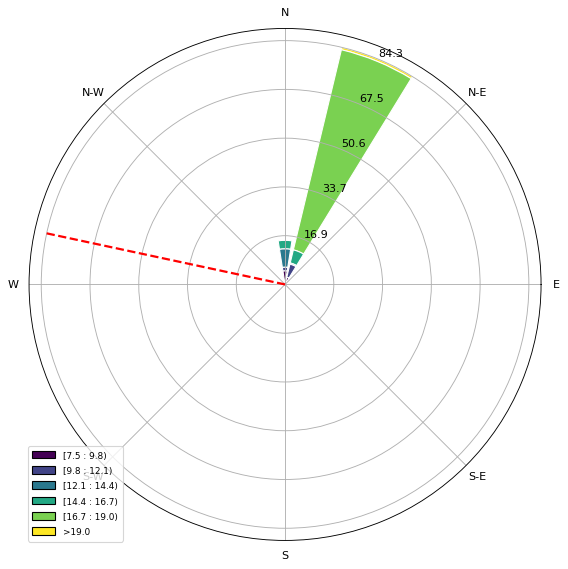

103 103
103 103


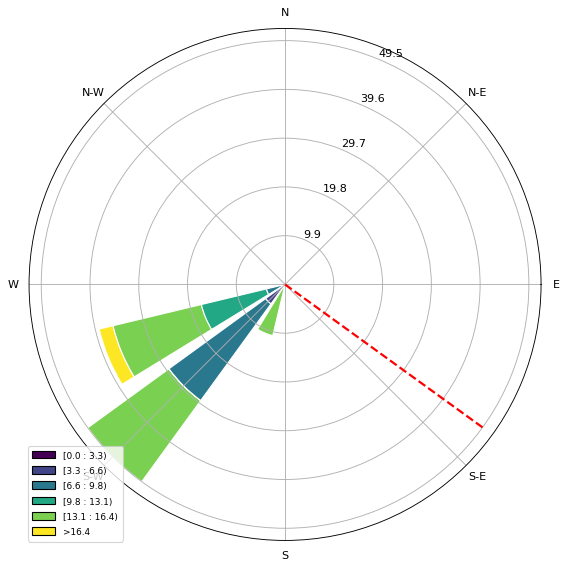

404 404
404 404


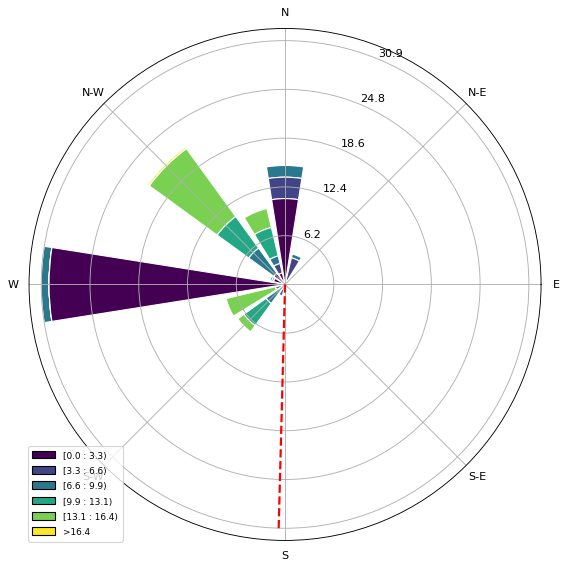

204 204
204 204


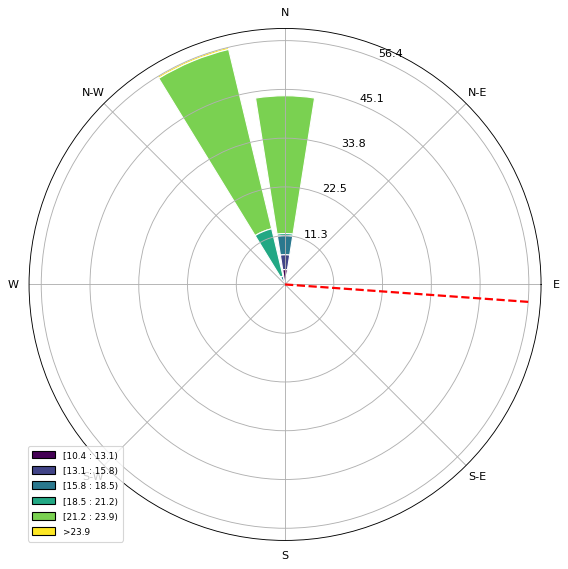

83 83
83 83


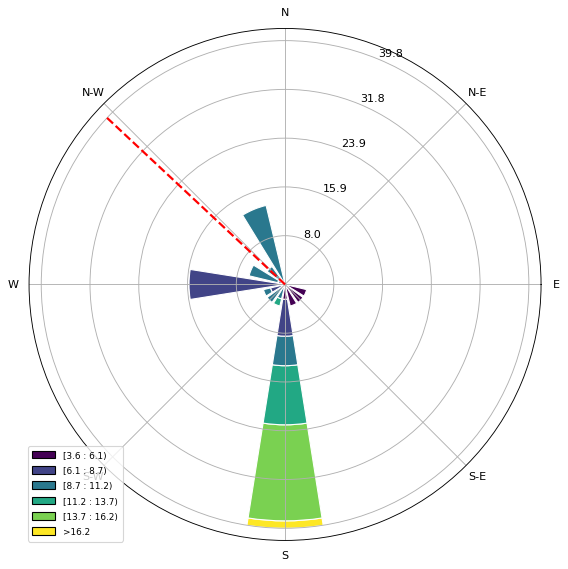

178 83
178 83


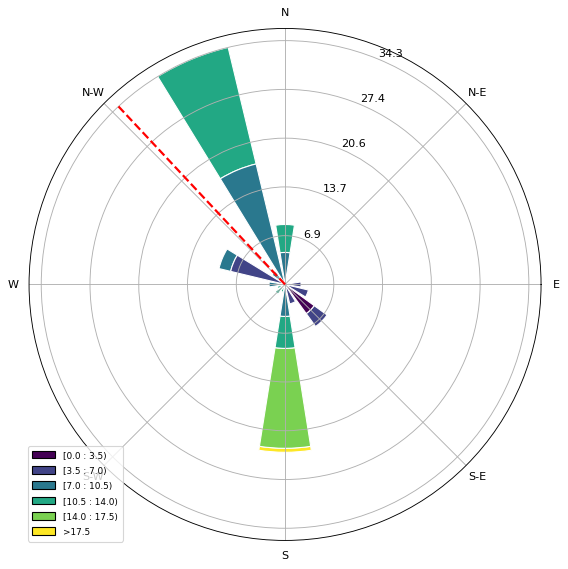

310 310
310 310


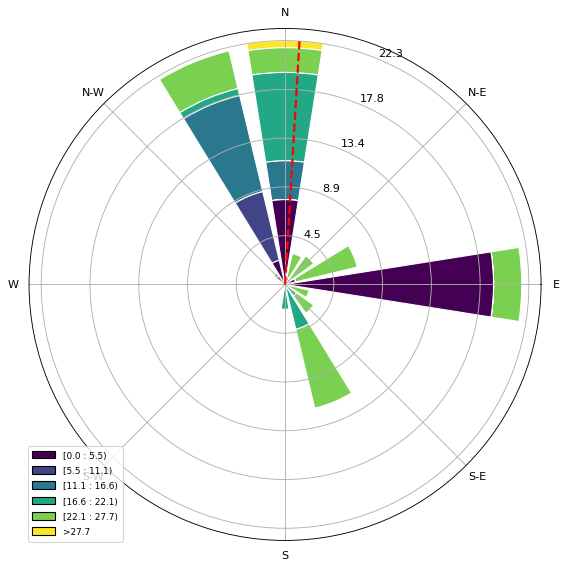

285 285
285 285


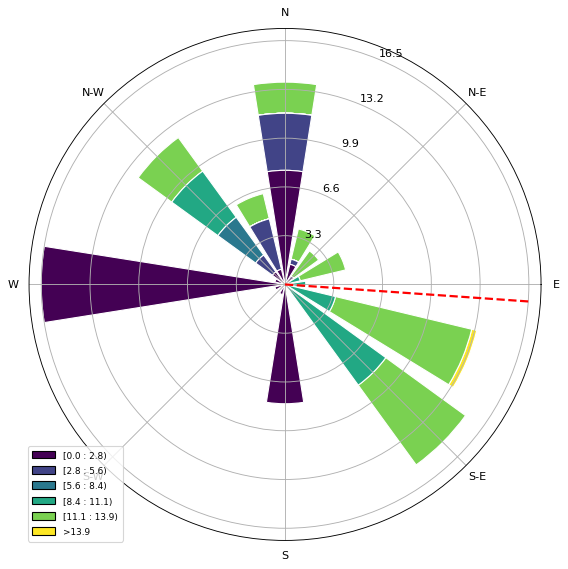

211 211
211 211


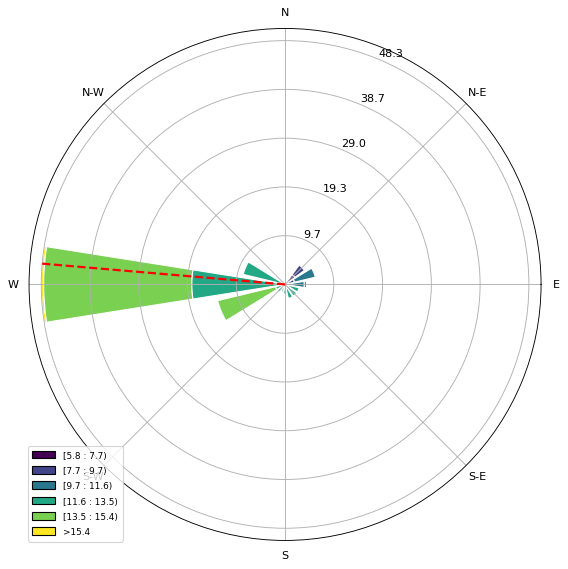

318 318
318 318


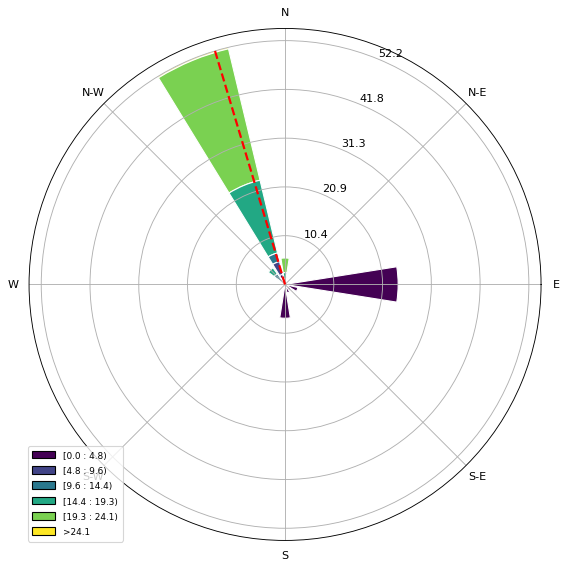

145 145
145 145


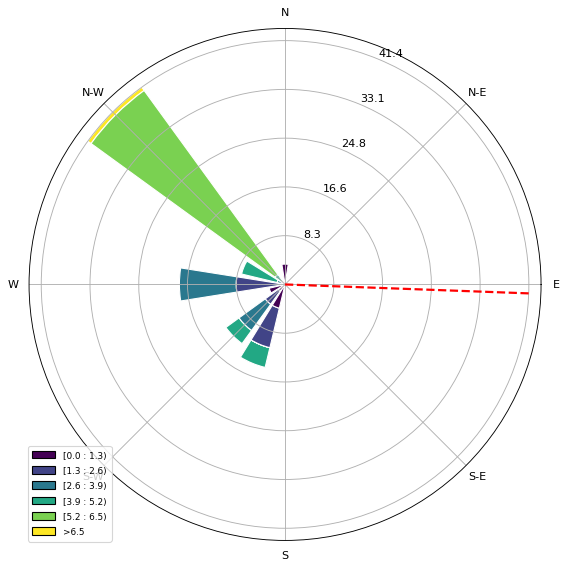

185 185
185 185


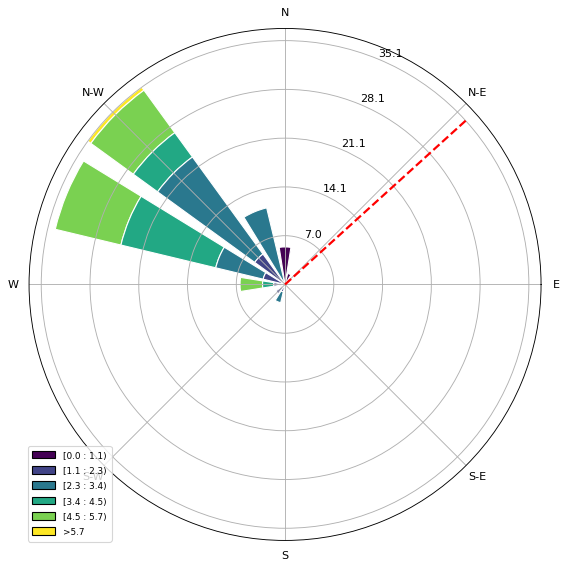

477 477
477 477


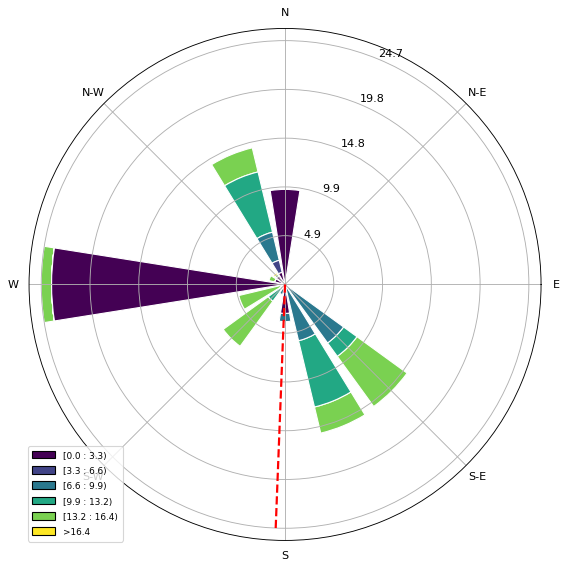

319 319
319 319


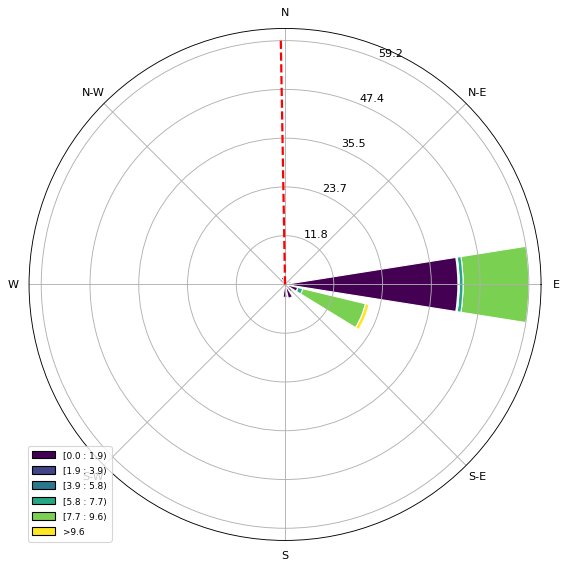

337 337
337 337


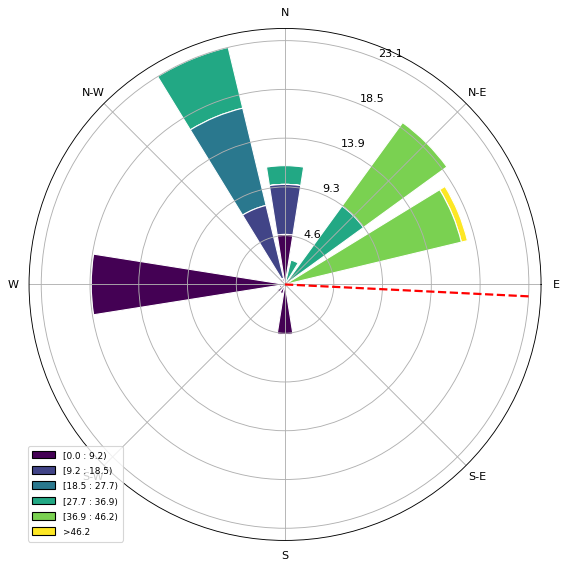

218 218
218 218


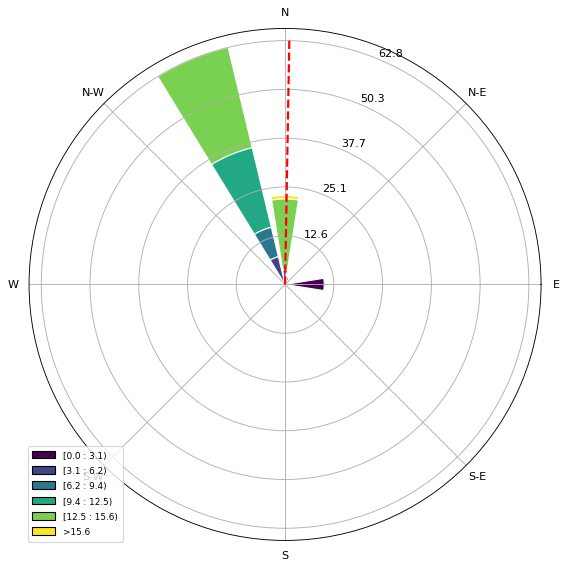

335 335
335 335


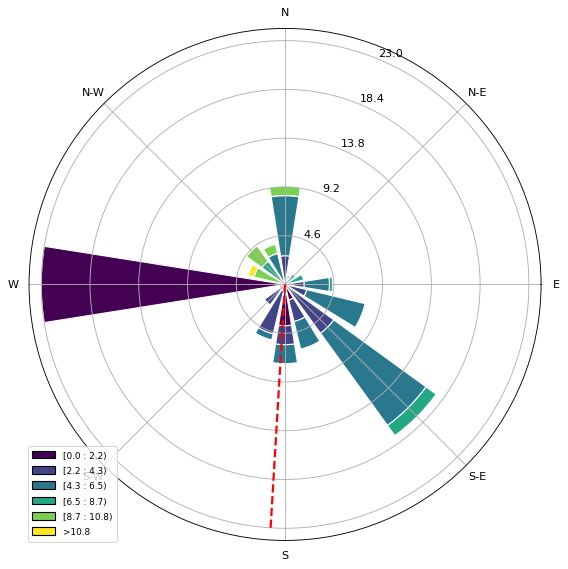

226 226
226 226


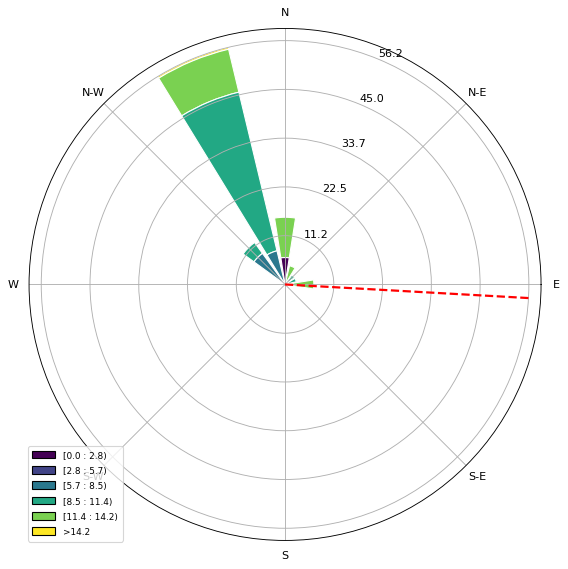

342 342
342 342


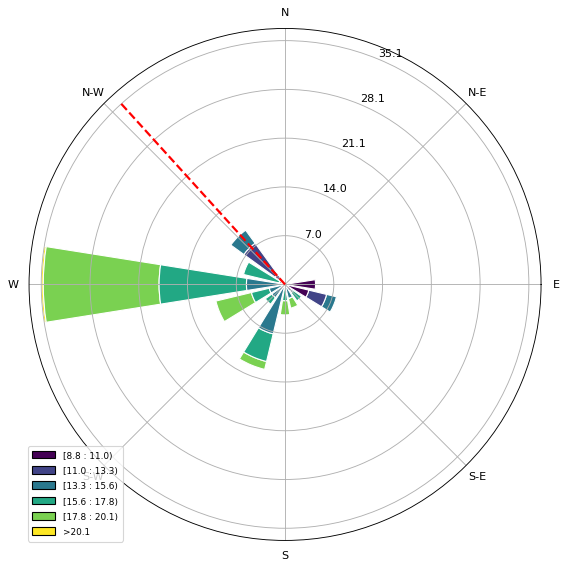

In [383]:
# windrose.
# wd = [0,90,180,180]
# ws = [10,30,40,50]
# # plt.hist(testData,bins=testData.__len__())
# ax = windrose.WindroseAxes.from_ax()
# ax.bar(wd, ws, normed=True, opening=0.8, edgecolor="white")
# ax.set_legend()
# plt.show()

# bins = windBins(dfArray)
# directionBins = bins[0]
# speedBins = bins[1]
# speedBins

# descentArray[0][0][' WndDr']

# for x in range(0,directionBins.__len__()):
#     for element in speedBins[x]:

def magneticWindDirection(heading,windDirection):
    newWindDirections = []
    for i in range(0,windDirection.__len__()):
            if(windDirection[i] == 'nan' or heading[i] == 'NaN'):
                a = 1
                newWindDirections.append(float(0))
            elif(float(windDirection[i]) <= 0):
                windScaled = 360+float(windDirection[i])
                windMagnetic = windScaled + float(heading[i])
                if(windMagnetic >= 360):
                    windMagnetic = windMagnetic - 360
                newWindDirections.append(float(windMagnetic))
            elif(float(windDirection[i]) >= 0):
                windMagnetic = float(windDirection[i]) +float(heading[i])
                if(windMagnetic >= 360):
                    windMagnetic = windMagnetic - 360
                newWindDirections.append(float(windMagnetic))
    return newWindDirections

# for x in range(0,descentArray.__len__()):
#     if(descentArray[x].__len__() > 0):
# index = 1
for index in range(0,descentArray.__len__()):
    for innerIndex in range(0,descentArray[index].__len__()):
        windDirectionArray = magneticWindDirection(descentArray[index][innerIndex][' HDG'].replace(' NaN','0'),descentArray[index][innerIndex][' WndDr'].replace(' NaN','0'))
        windSpeedArray = descentArray[index][innerIndex][' WndSpd'].replace(' NaN','0').astype(float).to_list()

        # windDirectionArray
        # arr = descentArray[index][0].fillna(0,inplace=True)
        # descentArray[1][0][' WndDr'][359]

        print(windDirectionArray.__len__(),descentArray[index][0][' WndDr'].__len__())
        print(windSpeedArray.__len__(),descentArray[index][0][' WndSpd'].__len__())
        # windDirectionArray.append(descentArray[index][innerIndex][' HDG'].iloc[-1])
        # windSpeedArray.append(50)

        #WIND ROSE
        ax = windrose.WindroseAxes.from_ax()
        ax.bar(windDirectionArray,windSpeedArray, normed=True, opening=0.8, edgecolor="white")


        heading_deg = float(
            descentArray[index][innerIndex][' HDG'].iloc[-1]
            # descentArray[index][innerIndex][' HDG'][265]
            )  # example: 45° (NE)
        theta = np.deg2rad(heading_deg)

        rmax = ax.get_rmax()
        ax.plot([theta, theta], [0, rmax], color='red', linewidth=2, linestyle='--')

        ax.set_legend()
        plt.show()

# Planning Notes

Major Differences in Input:
Model: Descents are already from start point to end Point
Empirical: Descents need to be identified in the files(Extra Step for the Empirical Files)

Take in csv files with the following columns:

Pitch
Roll
Airspeed
Heading


# Distance Aligned 0 Anchor Test

17 Files Loaded
4 Files Loaded


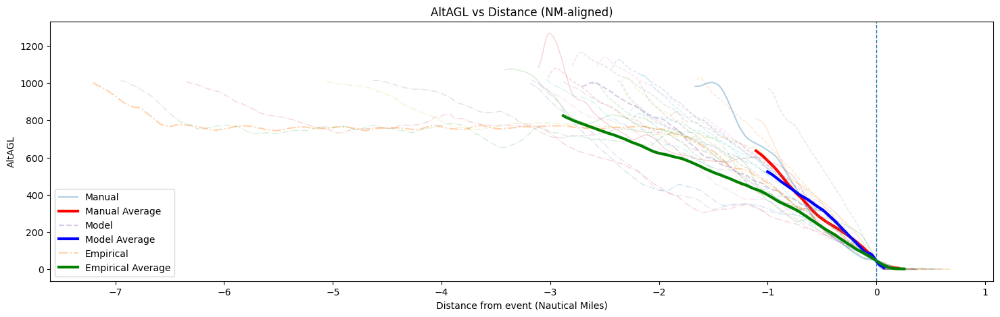

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy

import numpy as np
import matplotlib.pyplot as plt


#
# Environmental Filter
# 
def environmentalFilter(df, max_alt_at_1nm=500, dt=0.1):
    """
    Returns True if aircraft is below max_alt_at_1nm feet
    at approximately 1 NM before touchdown/runway.

    Assumes:
    - AltAGL is in feet
    - GndSpd is in knots
    - dt is seconds per row if no time column is available
    """

    if "AltAGL" not in df.columns or " GndSpd" not in df.columns:
        return False

    alt = pd.to_numeric(df["AltAGL"], errors="coerce").to_numpy()
    gs = pd.to_numeric(df[" GndSpd"], errors="coerce").to_numpy()

    valid = np.isfinite(alt) & np.isfinite(gs)
    if valid.sum() < 2:
        return False

    alt = alt[valid]
    gs = gs[valid]

    # Find touchdown / runway point as lowest valid altitude near end
    touchdown_index = np.nanargmin(alt)

    # Distance traveled per sample in nautical miles
    # knots = NM/hour, so NM per sample = knots * seconds / 3600
    dist_per_step_nm = gs * dt / 3600.0

    # Walk backward from touchdown, accumulating distance
    cumulative_back_nm = np.cumsum(dist_per_step_nm[:touchdown_index + 1][::-1])

    # Find point closest to 1 NM before touchdown
    idx_back = np.argmin(np.abs(cumulative_back_nm - 1.0))
    one_nm_index = touchdown_index - idx_back

    alt_at_1nm = alt[one_nm_index]

    return True
        
    
    # # Wind Direction on Landing is Within 30 Degrees of landing direction
    # if ' WndDr' in df or ' Pitch' in df:
    #     # wd_rel = df[' WndDr']
    #     # # hdg_mag = df[' HDG']
    #     # mag_var = df[' MagVar']  # east positive

    #     # hdg_true = hdg_mag + mag_var
    #     # wd_true = (wd_rel + hdg_true) % 360

    #     return True

    # if ' WndSpd' in df and ' WndDr' in df:
    #     return (df[' WndSpd'] > 10) & (df[' WndDr'] > 180)
    # return pd.Series([False] * len(df))

# -----------------------------
# COLUMN EXTRACTION
# -----------------------------
def get_array(obj, column):
    if hasattr(obj, "columns"):
        return np.array(obj[column], dtype=float)
    if isinstance(obj, dict):
        return np.array(obj[column], dtype=float)
    return np.array(obj, dtype=float)


# -----------------------------
# FLATTEN INPUT STRUCTURE
# -----------------------------
def flatten(data):
    for item in data:
        if isinstance(item, list):
            yield from flatten(item)
        else:
            yield item


# -----------------------------
# FIND EVENT INDEX
# -----------------------------
# def find_event_index(df, column="AltAGL", threshold=100):
#     arr = get_array(df, column)
#     idx = np.where(arr < threshold)[0]
#     return idx[0] if len(idx) > 0 else None

def find_event_index(
    df,
    column="AltAGL",
    threshold=100,
    alt_scale_factor=1.0
):

    arr = get_array(df, column)

    # Apply altitude scaling BEFORE threshold detection
    arr = arr * alt_scale_factor

    idx = np.where(arr < threshold)[0]

    return idx[0] if len(idx) > 0 else None


# -----------------------------
# BUILD NAUTICAL MILE DISTANCE AXIS
# -----------------------------
def build_nm_axis(df, ref_index, dt=1.0, speed_scale_factor=1.0):
    """
    Builds distance axis in nautical miles.

    speed_scale_factor converts input speed units to knots.
    """

    speed = get_array(df, " GndSpd")

    # Convert to knots if needed
    speed = speed * speed_scale_factor

    # knots -> NM/sec
    nm_per_sec = speed / 3600.0

    # integrate distance
    nm = np.cumsum(nm_per_sec * dt)

    # align to reference point
    nm = nm - nm[ref_index]

    return nm

# -----------------------------
# GET SIGNAL
# -----------------------------
def get_series(df, column):
    return get_array(df, column)

# -----------------------------
# MAIN PLOT FUNCTION (NM X-AXIS)
# -----------------------------
def plot_aligned_group_nm(
    data_list,
    column,
    event_col="AltAGL",
    threshold=100,
    dt=1.0,
    scale_factor=1.0,
    speed_scale_factor=1.0
):

    plt.figure(figsize=(18, 5))

    for df in flatten(data_list):

        try:
            ref_index = find_event_index(df, event_col, threshold)
            if ref_index is None:
                continue

            y = get_series(df, column)

            # ---- APPLY UNIT CONVERSION HERE ----
            y = y * scale_factor

            x = x = build_nm_axis(
    df,
    ref_index,
    dt=dt,
    speed_scale_factor=speed_scale_factor
)

            n = min(len(x), len(y))
            x, y = x[:n], y[:n]

            plt.plot(x, y, alpha=0.25, linewidth=1)

        except Exception as e:
            print("Skipping run:", e)

    plt.axvline(0, color="black", linestyle="--")
    plt.xlabel("Distance from event (Nautical Miles)")
    plt.ylabel(column)
    plt.title(f"{column} vs Distance (NM-aligned)")
    plt.show()

# -----------------------------
# SINGLE RUN VERSION
# -----------------------------
def plot_aligned_run_nm(df, column, event_col="AltAGL", threshold=100, dt=1.0):
    ref_index = find_event_index(df, event_col, threshold)
    if ref_index is None:
        print("No event found")
        return

    y = get_series(df, column)
    x = build_nm_axis(df, ref_index, dt=dt)

    n = min(len(x), len(y))
    plt.plot(x[:n], y[:n])

    plt.axvline(0, color="black", linestyle="--")
    plt.xlabel("Distance from event (Nautical Miles)")
    plt.ylabel(column)
    plt.title(column)
    plt.show()

def plot_multiple_groups_nm(
    data_groups,
    column,
    event_col="AltAGL",
    threshold=100,
    dt=1.0,
    scale_factors=None,
    speed_scale_factors=None,
    labels=None,
    lineStyles=None,
    averageColors=None
):

    # defaults
    if scale_factors is None:
        scale_factors = [1.0] * len(data_groups)

    if speed_scale_factors is None:
        speed_scale_factors = [1.0] * len(data_groups)

    if labels is None:
        labels = [f"Group {i}" for i in range(len(data_groups))]
    if lineStyles is None:
        lineStyles = [f"--" for i in range(len(data_groups))]

    plt.figure(figsize=(18, 5))

    for group, scale, speed_scale, label, lineStyle,avgColor in zip(
        data_groups,
        scale_factors,
        speed_scale_factors,
        labels,
        lineStyles,
        averageColors
    ):

        first_line = True

        all_traces = []

        for df in flatten(group):
            if environmentalFilter(df) is True: 
                try:
                    ref_index = find_event_index(
                        df,
                        event_col,
                        threshold,
                        scale
                    )

                    if ref_index is None:
                        continue

                    # Y variable scaling
                    y = get_series(df, column) * scale

                    # Distance axis
                    x = build_nm_axis(
                        df,
                        ref_index,
                        dt=dt,
                        speed_scale_factor=speed_scale
                    )

                    n = min(len(x), len(y))

                    all_traces.append((x, y))


                    if first_line:
                        plt.plot(
                            x[:n],
                            y[:n],
                            alpha=0.35,
                            linewidth=1.5,
                            label=label,
                            linestyle=lineStyle
                        )
                        first_line = False
                    else:
                        plt.plot(
                            x[:n],
                            y[:n],
                            alpha=0.2,
                            linewidth=1,
                            linestyle=lineStyle
                        )


                except Exception as e:
                    print("Skipping run:", e)
        if all_traces:
                xmin = max(trace[0].min() for trace in all_traces)
                xmax = min(trace[0].max() for trace in all_traces)
                common_x = np.linspace(xmin, xmax, 500)
                interpolated = []
                for x, y in all_traces:
                    interp_y = np.interp(common_x, x, y)
                    interpolated.append(interp_y)
                mean_y = np.mean(interpolated, axis=0)

                plt.plot(
                    common_x,
                    mean_y,
                    color=avgColor,
                    linewidth=3,
                    label=f"{label} Average"
                )

    plt.axvline(0, linestyle="--", linewidth=1)

    plt.xlabel("Distance from event (Nautical Miles)")
    plt.ylabel(column)
    plt.title(f"{column} vs Distance (NM-aligned)")
    # plt.xlim(-2, 0.5)
    plt.legend()
    plt.show()

modelData = deepcopy(utilizeModelData())
manualData = deepcopy(utilizeModelData(True))
empiricalData = deepcopy(descentArray)
# plot_aligned_group_nm(
#     empiricalData[1:5],
#     column="AltAGL",
#     threshold=100,
#     scale_factor = 1,
#     speed_scale_factor=1.0
# )

# plot_aligned_group_nm(
#     manualData,
#     column="AltAGL",
#     threshold=5,
#     scale_factor=3.28084,
#     speed_scale_factor=1.94384
# )

# plot_aligned_group_nm(
#     modelData,
#     column="AltAGL",
#     threshold=5,
#     scale_factor=3.28084,
#     speed_scale_factor=1.94384
# )




plot_multiple_groups_nm(
    [manualData, modelData,empiricalData[1:20]],
    column="AltAGL",
    threshold=50,
    scale_factors=[3.28084, 3.28084, 1.0],
    speed_scale_factors=[1.94384, 1.94384, 1.0],
    labels=["Manual", "Model", "Empirical"],
    lineStyles=["-", "--", "-."],
    averageColors=["red", "blue", "green"]
)